# Исследование рынка заведений общественного питания Москвы

**Заказчик:**

Инвесторы из фонда, которые хотят открыть в Москве заведение общественного питания. 

**Цель исследования:**

Изучить рынок общественного питания Москвы, выявить интересные особенности и закономерности, которые помогут в выборе подходяшего инвесторам места. 

**Задачи:**

* Изучить какие типы заведений пристуствуют на московском рынке.
* Изучить характеристики этих заведений (кол-во посадочных мест).
* Найти соотношение сетевых и несетевых заведений в Москве и определить топ-15 популярных сетей.
* Изучить пространственное распределение заведений по районам Москвы. 
* Детально изучить кофейни. 


**Доступные для исследования данные**

Датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках.

Описание данных
Файл moscow_places.csv:
* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: 
  -  «Средний счёт: 1000–1500 ₽»;
  -  «Цена чашки капучино: 130–220 ₽»;
  -  «Цена бокала пива: 400–600 ₽». и так далее;
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: 
  -  Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  -  Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  -  Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: 
  -  Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  -  Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  -  Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
  - 0 — заведение не является сетевым
  - 1 — заведение является сетевым
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.


In [452]:
# импортируем нужные для работы библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px
import json

## Открытие данных

In [453]:
df = pd.read_csv('/datasets/moscow_places.csv')

In [454]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [455]:
# читаем файл с геоданным и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

### Ознакомимся с общей информацией

In [456]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [457]:
df.describe(include = "all")

# include = "all" - Сколько уникальных значений в наборе данных - unique; top значения; частота появления значений - freg

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406,8406,8406,8406,7870,8406.000000,8406.000000,8406.000000,3315,3816,3149.000000,535.000000,8406.000000,4795.000000
unique,5614,8,5753,9,1307,NaN,NaN,NaN,4,897,NaN,NaN,NaN,NaN
top,Кафе,кафе,"Москва, проспект Вернадского, 86В",Центральный административный округ,"ежедневно, 10:00–22:00",NaN,NaN,NaN,средние,Средний счёт:1000–1500 ₽,NaN,NaN,NaN,NaN
freq,189,2378,28,2242,759,NaN,NaN,NaN,2117,241,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,55.750109,37.608570,4.229895,NaN,NaN,958.053668,174.721495,0.381275,108.421689
std,NaN,NaN,NaN,NaN,NaN,0.069658,0.098597,0.470348,NaN,NaN,1009.732845,88.951103,0.485729,122.833396
min,NaN,NaN,NaN,NaN,NaN,55.573942,37.355651,1.000000,NaN,NaN,0.000000,60.000000,0.000000,0.000000
25%,NaN,NaN,NaN,NaN,NaN,55.705155,37.538583,4.100000,NaN,NaN,375.000000,124.500000,0.000000,40.000000
50%,NaN,NaN,NaN,NaN,NaN,55.753425,37.605246,4.300000,NaN,NaN,750.000000,169.000000,0.000000,75.000000
75%,NaN,NaN,NaN,NaN,NaN,55.795041,37.664792,4.400000,NaN,NaN,1250.000000,225.000000,1.000000,140.000000


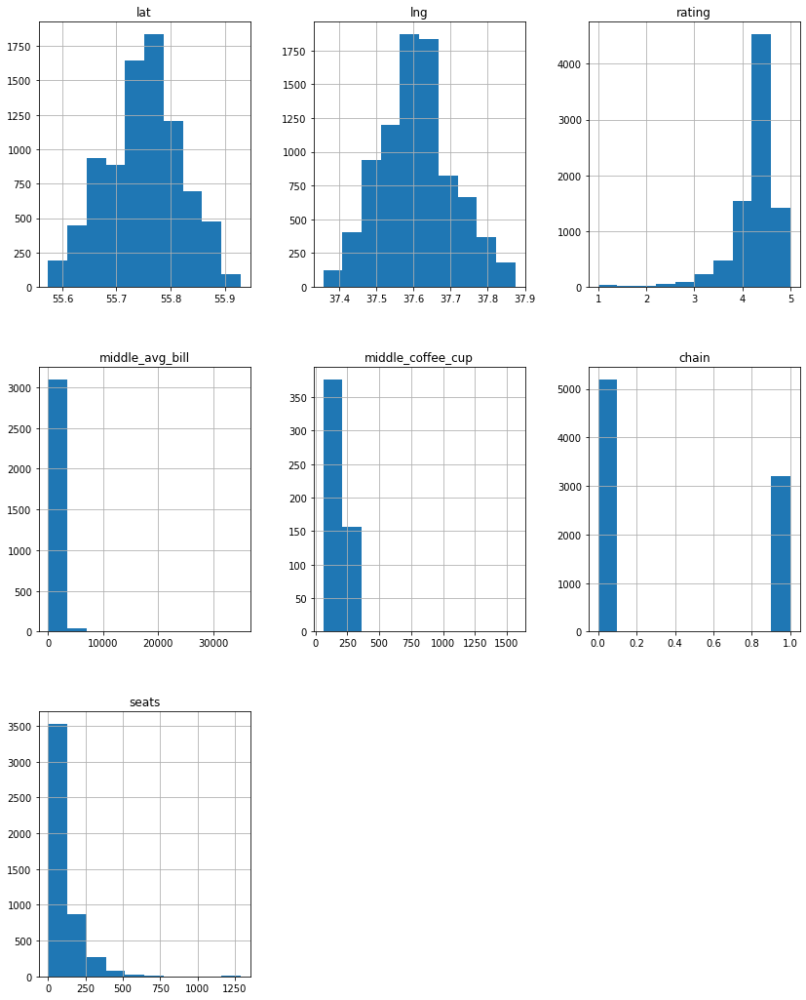

In [458]:
# Построим общую гистограмму для всех числовых столбцов таблицы
df.hist(figsize=(14, 18));

In [459]:
# посчитаем корреляционную матрицу
df.corr().style.format("{:.3f}").background_gradient(cmap='Blues', axis=1).highlight_max(color='white')

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
lat,1.000,-0.129,0.028,-0.006,-0.001,-0.017,-0.023
lng,-0.129,1.000,-0.017,-0.053,-0.038,-0.047,-0.089
rating,0.028,-0.017,1.000,0.183,0.100,-0.015,0.021
middle_avg_bill,-0.006,-0.053,0.183,1.000,nan,-0.129,0.082
middle_coffee_cup,-0.001,-0.038,0.100,nan,1.000,-0.029,-0.025
chain,-0.017,-0.047,-0.015,-0.129,-0.029,1.000,0.042
seats,-0.023,-0.089,0.021,0.082,-0.025,0.042,1.000


In [460]:
print('Кол-во уникальных названий заведений в датасете:', len(df['name'].unique()))

Кол-во уникальных названий заведений в датасете: 5614


**Первые наблюдения о данных**

- Всего в датафрейме 8406 заведений, а кол-во уникальных названий 5614. Можно предположить, что в данных много сетевых заведений. Больше всего в данных заведений с типом "кафе".
- Представлены данные как типа object, так и числовые данные. Часть столбцов - это категориальные данные, например, столбец price, chine, и с текстовым описанием параметров, такие как avg_bill, hours. 
- В данных наблюдаются много пропусков, особенно в столбцах со стоимостью.
- Помимо пропусков присутствуют аномальные значения в столбцах со средним чеком (middle_avg_bill), средней стоимостью кофе (middle_coffee_cup) и кол-вом посадочных мест (seats).
- Большинство заведений расположено в центре Москвы и к окраинам кол-во плавно уменьшается. Наибольшее кол-во заведений находится в Центральном административном округе.
- Наиболее часто встречаются заведения со средней ценовой категорией. 
- Чаще всего режим работы у заведений "ежедневно, 10:00–22:00", но в целом в данных встречается 1307 вариаций режима работы.
- В данных присутствуют заведения как с очень низким рейтингом, так и с максимальным, но наибольшее кол-во заведений имеет рейтинг 4,5. 
- По корреляционной матрице не было выявлено значимых взаимосвязей между различными параметрами, представленными в таблице. Стоит отметить наличие слабой взаимосвязи (R=0.18) между рейтингом и средним чеком. 
- Часто встречается адрес Москва, проспект Вернадского, 86В, проверить нет ли дубликатов.


Координаты Москвы в десятичных градусах
 - Широта: 55.7522200°
 - Долгота: 37.6155600°
 
 
Аномальные заведения скорее всего стоит удалить из данных, чтобы высокие значения не влияли на среднюю картину заведений в Москве.


## Предобработка данных

### Работа с пропусками 

In [461]:
df.isna().sum().sort_values()

name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
hours                 536
seats                3611
avg_bill             4590
price                5091
middle_avg_bill      5257
middle_coffee_cup    7871
dtype: int64

In [462]:
# для наглядности визуализируем пропуски в процентах от общего кол-ва данных

#напишем функцию для визуализации
def pass_value_barh(df):
    nan_data = (
                (df.isna().mean()*100)
                .to_frame()
                .rename(columns = {0:'space'})
                .query('space > 0')
                .sort_values(by = 'space', ascending = True)
    )
            
    nan_data.plot(kind = 'barh', figsize = (19,6), legend = False, fontsize = 16, grid=True)\
            .set_title('Количество пропущенных значений в столбцах, %', fontsize = 22, color = 'SteelBlue')

    for i in range(len(nan_data)): # подписываем значения на графике 
        plt.annotate(text=round(nan_data.iloc[i]['space'], 1), 
                              xy=(nan_data.iloc[i]['space']-5, i), 
                              color='white', fontsize = 14, fontweight='bold');    



# как делать аннотации к графику     
# https://proglib.io/p/vasha-povsednevnaya-shpargalka-po-matplotlib-2021-02-04
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.annotate.html

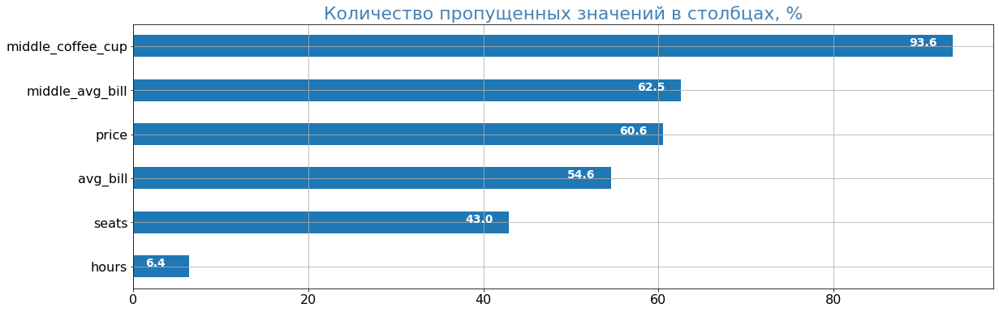

In [463]:
# применим функцию
pass_value_barh(df)

**Наблюдения**

Пропуски присутствуют в 6 столбцах: 
- hours (режим работы),
- seats (кол-во посадочных мест),
- avg_bill (средняя стоимость заказа в виде диапазона), 
- price (категория цен в заведении), 
- middle_avg_bill (число с оценкой среднего чека),
- middle_coffee_cup (число с оценкой одной чашки капучино).

Значения в столбцах middle_avg_bill и middle_coffee_cup зависят от того, что указано в столбце avg_bill. В них больше всего пропусков. 93.6% и 62.5% соответственно. Мы никак не можем восстановить эти пропуски по другим столбцам. Удалить также не можем, поскольку потеряем много данных. Оставим так как есть. 

Далее по кол-ву пропусков идет столбец price (60.6%). Частично (для 470 строк) данные для этого столбца можно восстановить по значениям из столбца middle_avg_bill. Но поскольку столбец price прктически не будет задействован в исследовании, то это нецелесообразно и не будет значительного улучшения качества данных, скорее наоборот. 

В столбцах avg_bill и seats также много пропусков (54.6% и 43% соответственно). Заменять пропуски медианой скорее всего не целесообразно ввиду большого процента пропусков. Заполнение сильно исказить исходные данные. Для сетевых заведений в целом можно попытаться восстановить данные по заведениям из сети, для которых есть данные, но от заведения к заведению значения варьируются (см. ниже пример для сети булочных "Буханка", разброс кол-ва посадочных мест от 10 до 180. Хотя, конечно, 150-180 посадочных мест для булочной -  это много, возможно ошибочные значения). 

**Итог**
На данном этапе принято решение оставить пропуски как есть и никак их не заполнять и не удалять.

In [464]:
# посмотрим есть ли строки для которых нет данных о price, но есть данные о middle_avg_bill
df[(df['price'].isnull() == True) & (df['middle_avg_bill'].isnull() == False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
27,Шаурму Х@чу,быстрое питание,"Москва, улица Дыбенко, 7, стр. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.879324,37.480280,4.1,NaN,Средний счёт:от 240 ₽,240.0,NaN,0,4.0
32,Додо Пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,1,46.0
34,Домино'с Пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,1,247.0
49,2U-Ту-Ю,пиццерия,"Москва, Ижорская улица, 8А",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,NaN,0,NaN
84,Meat Doner Kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,Средний счёт:300 ₽,300.0,NaN,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8347,Compass Coffee&Bakery,кафе,"Москва, Окская улица, 1, корп. 1",Юго-Восточный административный округ,"пн-пт 10:00–22:00; сб,вс 11:00–22:00",55.712435,37.752065,4.0,NaN,Средний счёт:300–400 ₽,350.0,NaN,0,80.0
8366,Ситипицца,пиццерия,"Москва, Ферганская улица, 12",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.708143,37.808957,4.2,NaN,Средний счёт:300–700 ₽,500.0,NaN,0,4.0
8383,Pizza24/7,пиццерия,"Москва, улица Юных Ленинцев, 10/15к1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.698824,37.738878,4.2,NaN,Средний счёт:150 ₽,150.0,NaN,0,NaN
8399,"Пекарня, кафе-гриль",булочная,"Москва, Болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,NaN,0,50.0


In [465]:
# найдем уникальные значения имен сетевых заведений в которых пропущены значения для столбца avg_bill
df[(df['avg_bill'].isnull() == True) & (df['chain'] == 1)]['name'].unique()

array(['Буханка', 'Пекарня', 'Чебуреки Манты', 'Drive Café',
       'В парке вкуснее', 'Крошка Картошка', 'Кафетерий', '9 Bar Coffee',
       'CofeFest', 'БлинБери', 'Арамье', 'Cofix', 'Шашлык',
       'Чебуречная история', 'Веранда', 'Хинкали-Gали!', 'Халяль',
       'Zамания', "Домино'с Пицца", 'Тбилисоба', 'Островок Суши',
       'Сеть поминальных залов', 'Встреча', 'Кулинария', 'Арарат',
       'Крепери', 'Хинкальная', 'Парус', 'One Price Coffee', 'Скалка',
       'Бистро 24', 'Яндекс Лавка', 'Wild bean cafe', 'Шаурма на углях',
       'Кушай Город', 'МосПлов', 'СушиСтор', 'ОШ', 'Wild Bean',
       'Восточная кухня', 'Тандыр № 1', 'Еда Greek', 'Vintage', 'Чайхана',
       'Хлеб с маслом', 'Pho Oanh', 'Шашлычный дворик', 'Груша', 'Дружба',
       'Hatimaki', 'Юг', 'Viet Ngon', "CoffeeBar'17", 'Маковка', 'Уголок',
       'Му-Му', 'Кондитерская Олега Ильина', 'Горячая выпечка',
       'Мир шашлыков', 'Кафе-пекарня', 'Самарканд', 'Чайхана 24',
       'Шоколадница', 'French Bakery', 'Пл

In [466]:
# выведем на экран все заведения сети булочных Буханка
df[df['name'] == 'Буханка']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0
23,Буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN
179,Буханка,булочная,"Москва, Юрловский проезд, 14, корп. 3",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.879131,37.613068,4.3,NaN,NaN,NaN,NaN,1,NaN
245,Буханка,булочная,"Москва, проезд Шокальского, 33",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.882732,37.648054,4.2,средние,Средний счёт:200–350 ₽,275.0,NaN,1,NaN
258,Буханка,булочная,"Москва, Полярная улица, 27, корп. 2",Северо-Восточный административный округ,"ежедневно, 07:00–23:00",55.882158,37.636682,4.2,NaN,NaN,NaN,NaN,1,52.0
437,Буханка,булочная,"Москва, Левобережная улица, 4к10",Северный административный округ,"ежедневно, 07:00–22:00",55.869521,37.480445,4.3,NaN,NaN,NaN,NaN,1,NaN
522,Буханка,булочная,"Москва, Авангардная улица, 16",Северный административный округ,"ежедневно, 08:00–22:00",55.847140,37.489748,4.1,NaN,NaN,NaN,NaN,1,NaN
568,Буханка,булочная,"Москва, Кронштадтский бульвар, 6, корп. 4",Северный административный округ,"ежедневно, 08:00–22:00",55.840723,37.494377,4.2,NaN,NaN,NaN,NaN,1,NaN
765,Буханка,булочная,"Москва, Бескудниковский бульвар, 32, корп. 5",Северный административный округ,"ежедневно, 08:00–22:00",55.871663,37.556900,4.4,NaN,NaN,NaN,NaN,1,NaN
872,Буханка,кофейня,"Москва, Ильменский проезд, 17, корп. 4",Северный административный округ,"ежедневно, 08:00–22:00",55.861985,37.540747,3.9,NaN,NaN,NaN,NaN,1,NaN


Стот отметить, что для одной и той же сети встречаются три разных категории заведений: булочная, кафе и кофейня. Это нормально? 

### Работа с дубликатами

In [467]:
# проверим на наличие явных дубликатов
df.duplicated().sum()

0

Явных дубликатов не обнаружено. Проверим на наличе неявных дубликатов в названиях категорий и районов. 

In [468]:
# проверим какие категории заведений есть в данных
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [469]:
# проверим какие районы представленны в данных
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [470]:
# проверим заведения по адресу Москва, проспект Вернадского, 86В, он встречается 28 раз в данных
df.query('address == "Москва, проспект Вернадского, 86В"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6531,Паrk фудхолл,"бар,паб","Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661639,37.480197,4.6,NaN,NaN,NaN,NaN,0,NaN
6532,I Need Doner,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 10:00...",55.661559,37.479887,4.9,NaN,Средний счёт:400–700 ₽,550.0,NaN,1,NaN
6534,Fibo Pasta & Ravioli,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,пн-сб 10:00–22:00; вс 11:00–22:00,55.661638,37.480148,4.8,средние,Средний счёт:500–1000 ₽,750.0,NaN,1,NaN
6547,Сыроварня,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"ежедневно, 11:00–23:00",55.661718,37.479907,4.5,высокие,Средний счёт:2000–2500 ₽,2250.0,NaN,1,NaN
6549,Bổ,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661638,37.480148,4.7,NaN,NaN,NaN,NaN,0,NaN
6568,Aly’s Poke,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661776,37.480123,4.6,средние,Средний счёт:390–660 ₽,525.0,NaN,0,NaN
6584,Курица и Утка по-Гонконгски,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"ежедневно, 11:00–23:00",55.661598,37.480319,4.3,NaN,NaN,NaN,NaN,0,NaN
6597,Асса Food,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661783,37.480264,4.3,NaN,NaN,NaN,NaN,0,NaN
6604,Shrimp Kitchen,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.661768,37.480026,4.4,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,NaN
6630,Мясоед,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661762,37.480336,4.2,NaN,NaN,NaN,NaN,0,NaN


In [471]:
len(df.query('address == "Москва, проспект Вернадского, 86В"')['name'].unique())

28

**Наблюдения**

Явных дубликатов нет. 

С названиями категорий заведений и районов Москвы всё в порядке, нет одинаковых названий, записанных в разном регистре или с опечатками. 

По адресу Москва, проспект Вернадского, 86В находится 28 заведений, но у всех разные названия. Скорее всего это крупный торговый центр.


### Работа с аномалиями

На этапе ознакомления с данными было выявлено, что в данных присутствуют аномальные значения в столбцах со средним чеком (middle_avg_bill), средней стоимостью кофе (middle_coffee_cup) и кол-вом посадочных мест (seats).

Рассмотрим более подробно эти аномалии. 

In [472]:
# посчитаем квантили для этих трех столбцов
df[['middle_avg_bill', 'middle_coffee_cup', 'seats' ]].quantile([0.0012, 0.01, .5, .95, .99, .9988]).style.format("{:,.2f}")

,middle_avg_bill,middle_coffee_cup,seats
0.0012,50.00,60.00,0.00
0.01,140.00,60.00,0.00
0.5,750.00,169.00,75.00
0.95,"2,250.00",275.00,307.00
0.99,"3,750.00",309.90,625.00
0.9988,"7,055.60",803.53,"1,288.00"


**Оценка среднего чека**

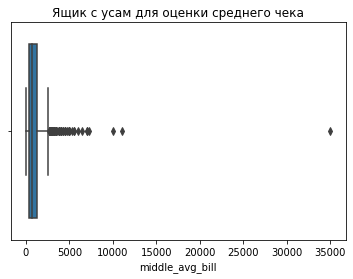

In [473]:
# построим ящики с усами 
ax1 = sns.boxplot(x=df['middle_avg_bill'])
ax1.set_title('Ящик с усам для оценки среднего чека');

In [474]:
df.query('middle_avg_bill > 10000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0
7177,Кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0


In [475]:
print('Кол-во значений за перделами 0.99 квантиля:', len(df[df['middle_avg_bill']> 3750]))

Кол-во значений за перделами 0.99 квантиля: 30


**Выводы** 
Высокий средний чек, в 35 000, скорее всего связан с тем, что этот ресторан является банкетным залом. В нём 100 посадочных мест. 

**Оценка одной чашки капучино**

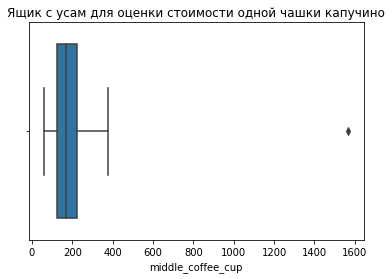

In [476]:
ax2 = sns.boxplot(x=df['middle_coffee_cup'])
ax2.set_title('Ящик с усам для оценки стоимости одной чашки капучино');

In [477]:
print('Кол-во значений за перделами 0.99 квантиля:', len(df[df['middle_coffee_cup']> 309.90]))

Кол-во значений за перделами 0.99 квантиля: 6


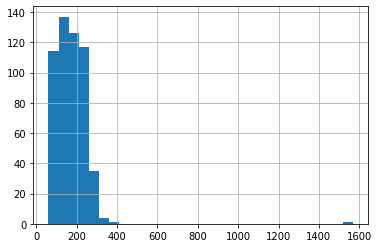

In [478]:
df['middle_coffee_cup'].hist(bins=30);

In [479]:
# найдём заведение со стоимостью чашки капучино дороже 1500 рублей
df.query('middle_coffee_cup >= 1500')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


**Выводы** Заведение относится к сети Шоколадница. В других заведениях сети таких высоких стоимостей за чашку не встречается, также после проверки меню на сайте https://shoko.ru/ было обнаружено, что самая дорогая чашка кофе на данный момент - это 310 рубле. Скорее всего это какое-то ошибочное значение. 

**Кол-во посадочных мест**

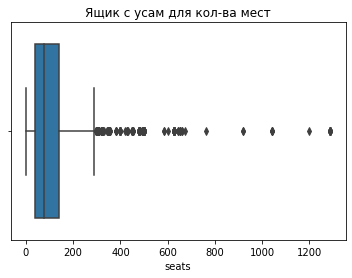

In [480]:
ax2 = sns.boxplot(x=df['seats'])
ax2.set_title('Ящик с усам для кол-ва мест');

In [481]:
print('Кол-во значений за перделами 0.99 квантиля:', len(df[df['seats']> 625]))

Кол-во значений за перделами 0.99 квантиля: 30


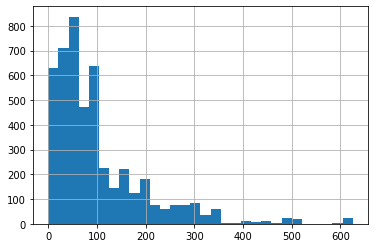

In [482]:
# посторим гистограмму для кол-ва посадочных мест меньше 0.99 квантиля 
df[df['seats']<=625]['seats'].hist(bins=30);

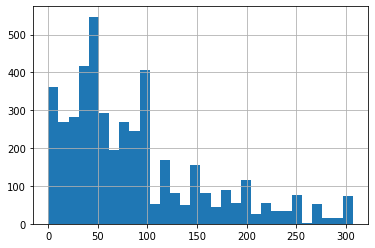

In [483]:
# посторим гистограмму для кол-ва посадочных мест меньше 0.95 квантиля 
df[df['seats']<=307]['seats'].hist(bins=30);

In [484]:
print('Кол-во значений за перделами 0.95 квантиля:', len(df[df['seats']> 307]))

Кол-во значений за перделами 0.95 квантиля: 239


In [485]:
df.query('seats > 625')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2713,Ваня и Гоги,"бар,паб","Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 11:00–06:00",55.789842,37.750282,4.2,высокие,Средний счёт:1000–2500 ₽,1750.0,NaN,0,1040.0
2722,Маргарита,быстрое питание,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 10:00–22:00",55.789527,37.752004,4.3,NaN,NaN,NaN,NaN,1,1040.0
2770,Шоколадница,кофейня,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"пн-ср 11:00–23:00; чт 11:00–00:00; пт,сб 11:00...",55.789903,37.749822,4.1,NaN,NaN,NaN,NaN,1,1040.0
2901,Ресторан Тройка,"бар,паб","Москва, Измайловское шоссе, 71, корп. 2Б",Восточный административный округ,"ежедневно, 11:00–23:00",55.789276,37.747832,3.7,NaN,NaN,NaN,NaN,0,660.0
2913,Хаус бар,"бар,паб","Москва, Измайловское шоссе, 71, корп. 2Б",Восточный административный округ,"ежедневно, 07:00–23:00",55.789639,37.747274,3.7,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,660.0
2966,Матрешка,кафе,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,NaN,55.789867,37.749656,4.0,NaN,NaN,NaN,NaN,0,1040.0
4180,Eataly,"бар,паб","Москва, Киевская улица, 2",Западный административный округ,"ежедневно, 12:00–23:00",55.743405,37.562535,4.6,NaN,NaN,NaN,NaN,0,920.0
4231,РестоБар Argomento,столовая,"Москва, Кутузовский проспект, 41, стр. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.738237,37.531819,4.2,высокие,Средний счёт:2500–5000 ₽,3750.0,NaN,0,1200.0
4245,Стейк & Бургер,кафе,"Москва, Киевская улица, 2",Западный административный округ,"ежедневно, 09:00–21:00",55.742953,37.561872,4.2,NaN,NaN,NaN,NaN,1,920.0
5486,Дом,кафе,"Москва, улица Юности, 1",Восточный административный округ,NaN,55.736204,37.815500,4.9,NaN,NaN,NaN,NaN,0,760.0


In [486]:
df.query('seats > 625').groupby('category')['name'].count()

category
бар,паб            7
быстрое питание    1
кафе               8
кофейня            5
пиццерия           1
ресторан           7
столовая           1
Name: name, dtype: int64

**Выводы** Большое кол-во посадочнх мест встречается во всех категориях заведений.

**Выводы**

После более подробного рассмотрения аномальных значений было выявлено, что высокий средний чек в 35000 рублей скорее всего соответствует банкетному залу, поскольку в этом заведении 100 посадочных мест. 

Аномально дорогая стоимость чашки капучино - скорее всего ошибочное значение. Не стоит удалять всю строку, но возможно имеет смылс заменить значение стоимости на NaN. 

Что касатеся большого кол-ва посадочных мест, возможно это просто фуд-корты в торговых центрах. Например: 
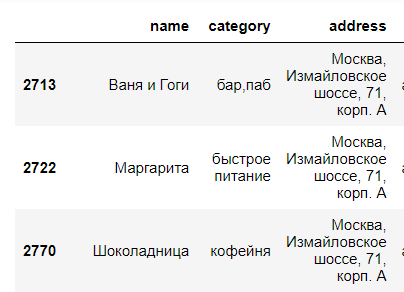 
Все три заведения находятся по одному адресу и во всех трёх 1040 посадочных мест. 

**Итог**
Аномалии из данных не удаляем, испраляем только ошибку для Шоколадницы.

In [487]:
#заменим для Шоколадницы по адресу Москва, Большая Семёновская улица, 27, корп. 1 
# значение стоимости чашки капучино на пропуск

df.loc[2859, 'middle_coffee_cup'] = np.nan

In [488]:
df.loc[2859, :]

name                                                    Шоколадница
category                                                    кофейня
address              Москва, Большая Семёновская улица, 27, корп. 1
district                           Восточный административный округ
hours                                        ежедневно, 08:00–23:00
lat                                                       55.782268
lng                                                       37.709022
rating                                                          4.2
price                                                       средние
avg_bill                             Цена чашки капучино:230–2907 ₽
middle_avg_bill                                                 NaN
middle_coffee_cup                                               NaN
chain                                                             1
seats                                                          48.0
Name: 2859, dtype: object

### Создадим новые столбцы

**Cтолбец street**

Создадим столбец street с названиями улиц из столбца с адресом.

In [489]:
df['street'] = df['address'].str.split(', ').str[1]

In [490]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


**Столбец is_24/7**

Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
* логическое значение True — если заведение работает ежедневно и круглосуточно;
* логическое значение False — в противоположном случае.


In [491]:
# посмотрим на уникальные значения режима работы
df['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [492]:
print('Кол-во уникальных режимов работы заведений:', len(df['hours'].unique()))

Кол-во уникальных режимов работы заведений: 1308


In [493]:
#найдем режими работы, содержащие слово "круглосуточно"
df[df['hours'].str.contains('круглосуточно', na=False)]['hours'].unique()

array(['ежедневно, круглосуточно',
       'пн 00:01–12:00, перерыв 12:00–13:30; вт-чт 13:30–12:00; пт 13:30–00:00; сб,вс круглосуточно',
       'вт-вс круглосуточно', 'сб круглосуточно', 'пт-вс круглосуточно',
       'пн,ср,чт,пт,сб,вс круглосуточно',
       'пн 10:00–00:00; вт-сб круглосуточно; вс 00:00–23:00',
       'пн-чт 07:30–23:00; пт 07:30–00:00; сб круглосуточно; вс 00:00–23:00',
       'пн круглосуточно; вт-чт 12:00–00:00; пт 12:00–02:00; сб 11:00–02:00; вс 14:00–00:00',
       'пн-чт 08:00–23:00; пт,сб круглосуточно; вс 08:00–23:00',
       'пн-ср 07:00–23:00; чт 07:00–00:00; пт,сб круглосуточно; вс 00:00–23:00',
       'пн-чт 08:00–23:00; пт 08:00–00:00; сб круглосуточно; вс 00:00–23:00',
       'пн 08:00–23:00; вт-пт 08:00–00:00; сб круглосуточно; вс 00:00–23:00',
       'пн-ср 09:00–00:00; чт-вс круглосуточно',
       'пн-чт круглосуточно; пт 00:00–05:00, перерыв 05:00–07:00; сб 07:00–05:00; вс 07:00–00:00',
       'пн-чт 11:00–23:00; пт 11:00–00:00; сб круглосуточно; вс 

Проверим входят ли в столбец hours какие-либо другие обозначения работы круглосуточно:

In [494]:
df[df['hours'].str.contains('24/7', na=False)]['hours'].unique()

array([], dtype=object)

In [495]:
df[df['hours'].str.contains('24', na=False)]['hours'].unique()

array([], dtype=object)

Нам подходит только обозначение "'ежедневно, круглосуточно'". 

In [496]:
# создадим новый столбец в зависимости от условия
df.loc[(df['hours'] == 'ежедневно, круглосуточно'), 'is_24/7'] = True
df.loc[(df['hours'] != 'ежедневно, круглосуточно'), 'is_24/7'] = False

In [497]:
# проверим создание нового столбца
df.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False


In [498]:
# посмотрим сколько заведений работают 24/7
len(df.loc[df['is_24/7']==True])

730

-----------------------------------------------------

## Анализ данных

In [499]:
df.describe(include = "all")

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
count,8406,8406,8406,8406,7870,8406.000000,8406.000000,8406.000000,3315,3816,3149.000000,534.000000,8406.000000,4795.000000,8406,8406
unique,5614,8,5753,9,1307,NaN,NaN,NaN,4,897,NaN,NaN,NaN,NaN,1448,2
top,Кафе,кафе,"Москва, проспект Вернадского, 86В",Центральный административный округ,"ежедневно, 10:00–22:00",NaN,NaN,NaN,средние,Средний счёт:1000–1500 ₽,NaN,NaN,NaN,NaN,проспект Мира,False
freq,189,2378,28,2242,759,NaN,NaN,NaN,2117,241,NaN,NaN,NaN,NaN,184,7676
mean,NaN,NaN,NaN,NaN,NaN,55.750109,37.608570,4.229895,NaN,NaN,958.053668,172.112360,0.381275,108.421689,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,0.069658,0.098597,0.470348,NaN,NaN,1009.732845,65.408333,0.485729,122.833396,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,55.573942,37.355651,1.000000,NaN,NaN,0.000000,60.000000,0.000000,0.000000,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,55.705155,37.538583,4.100000,NaN,NaN,375.000000,124.250000,0.000000,40.000000,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,55.753425,37.605246,4.300000,NaN,NaN,750.000000,168.000000,0.000000,75.000000,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,55.795041,37.664792,4.400000,NaN,NaN,1250.000000,225.000000,1.000000,140.000000,NaN,NaN


**Выводы**
* Всего 8406 заведений.
* Наиболее часто встречающаяся категория - кафе, а всего 8 категорий. 
* Больше всего заведений в Центральном АО.
* Наиболее частый режим работы - ежедневно, 10:00–22:00.
* В основном у заведений высокий рейтинг. Только у 25% данных рейтинг ниже 4.1.
* Чаще всего заведения относятся к средней ценовой категории.
* Медианное значение среднего счета - 750 рублей, а стоимости одной чашки капучино 168 рублей. В целом эти два параметра варьируются довольно сильно от заведения к заведению (стандартное отклонение 1009.7 и 65.4 рубля соответственно). 
* Основная доля заведений не работает ежедневно и круглосуточно.


### Категории заведений

Какие категории заведений представлены в данных? Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.

In [500]:
# посчитаем сколько заведений относится к каждой категории
category = df.groupby(by='category')['category'].count().sort_values(ascending=True).to_frame()
category.columns = ['Кол-во заведений']
category.reset_index(inplace= True)
category['Доля от общего числа заведений, %'] = round(category['Кол-во заведений']/category['Кол-во заведений'].sum()*100, 2)
category.sort_values(by='Доля от общего числа заведений, %', ascending=False)

,category,Кол-во заведений,"Доля от общего числа заведений, %"
7,кафе,2378,28.29
6,ресторан,2043,24.30
5,кофейня,1413,16.81
4,"бар,паб",765,9.10
3,пиццерия,633,7.53
2,быстрое питание,603,7.17
1,столовая,315,3.75
0,булочная,256,3.05


Визуализируем результаты:

In [501]:
fig = px.bar(category, # загружаем данные и заново их сортируем             
 x='Кол-во заведений', # указываем столбец с данными для оси X             
 y='category', # указываем столбец с данными для оси Y             
 text='Кол-во заведений') # добавляем аргумент, который отобразит текст с информацией                               

# оформляем график
fig.update_layout(title={'text':'<b>Количество объектов общественного питания по категориям', 'y':0.92,
        'x':0.535,
        'xanchor': 'center',
        'yanchor': 'top'}, font=dict(
            family="Arial",
            size=12),                  
                  xaxis_title='Количество заведений',                   
                  yaxis_title='Категория',
                  width=720, height=450)
fig.show()


**Выводы**

Всего в данных представлено 8 категорий заведений. Категории с наибольшим кол-вом заведений - это кафе и рестораны, а с наименьшим - столовые и булочные.

### Кол-во посадочных мест по категориям

In [502]:
df['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

In [503]:
seats = df.groupby(by='category')['seats'].median().sort_values(ascending=True).to_frame()
seats.reset_index(inplace= True)
seats.sort_values(by='seats', ascending=False)

,category,seats
7,ресторан,86.0
6,"бар,паб",82.5
5,кофейня,80.0
4,столовая,75.5
3,быстрое питание,65.0
2,кафе,60.0
1,пиццерия,55.0
0,булочная,50.0


In [504]:
fig = px.bar(seats,      
 x='seats',   
 y='category',      
 text='seats')

# оформляем график
fig.update_layout(title={'text':'<b>Количество посадочных мест по категориям заведений', 'y':0.92,
        'x':0.52,
        'xanchor': 'center',
        'yanchor': 'top'}, font=dict(
            family="Arial",
            size=14),
            xaxis_title='Количество посадочных мест',                   
            yaxis_title='Категория', width=720, height=450)
fig.show()

**Выводы**

После подсчёта медианного значения кол-ва мест для различных категорий заведений общественного питания, получили довольно ожидаемые результаты: наибольшее кол-во посадочных мест в категориях "ресторан" и "бар, паб", а наименьшее в булочных. Стоит также отметить довольно большое кол-во посадочных мест в кофейнях - 80. 

### Соотношение сетевых и не сетевых заведений

In [505]:
print('Кол-во сетевых заведений:', len(df.query('chain == 1')))
print('Кол-во не сетевых заведений:', len(df.query('chain == 0')))

Кол-во сетевых заведений: 3205
Кол-во не сетевых заведений: 5201


In [506]:
fig = go.Figure(data=[go.Pie(
                             labels=['Кол-во сетевых заведений','Кол-во не сетевых заведений'], 
                             values=[len(df.query('chain == 1')), len(df.query('chain == 0'))]
                             )
                     ])
                      
fig.update_layout(title={'text':'<b>Доля от общего числа заведений, %','y':0.9,
        'x':0.44,
        'xanchor': 'center',
        'yanchor': 'top'}, 
            font=dict(
            family="Arial",
            size=12)) 

fig.show()

**Какие категории заведений чаще являются сетевыми?**

In [507]:
chain_category = df.groupby(['category', 'chain'], as_index=False)['name'].count()
chain_category = chain_category.rename(columns={"name": "count_object"}) 
chain_category['total_object'] = chain_category.groupby('category')['count_object'].transform(sum)
chain_category['ratio'] = round(chain_category['count_object']/chain_category['total_object']*100, 2)
chain_category.sort_values(by='total_object', ascending=False)

,category,chain,count_object,total_object,ratio
6,кафе,0,1599,2378,67.24
7,кафе,1,779,2378,32.76
12,ресторан,0,1313,2043,64.27
13,ресторан,1,730,2043,35.73
8,кофейня,0,693,1413,49.04
9,кофейня,1,720,1413,50.96
0,"бар,паб",0,596,765,77.91
1,"бар,паб",1,169,765,22.09
10,пиццерия,0,303,633,47.87
11,пиццерия,1,330,633,52.13


In [508]:
fig = px.bar(chain_category.sort_values(by=['chain','ratio'], ascending=False), 
             x='ratio', y='category', color='chain', text='ratio')

# оформляем график
fig.update_layout(title={'text':'<b>Соотношение сетевых и не сетевых заведений по категориям', 'y':0.92,
        'x':0.52,
        'xanchor': 'center',
        'yanchor': 'top'}, font=dict(
            family="Arial",
            size=14),
            xaxis_title='Доля заведений от общего кол-ва заведений в категории, %',                   
            yaxis_title='Категория', width=720, height=450)
fig.show()

**Выводы**
Среди заведений, представленных в датасете, преобладают не сетевые (61.5% против 38.5%).
Если рассматривать заведения по категориям, то доля сетевых заведений наибольшая среди булочных, пиццерий и кофеин: более 50% заведений этих категория являются сетевыми. Меньше всего сетевых заведений среди заведений категории "бар, паб".


### Топ-15 популярных сетей Москвы

*Под популярностью в данном случае понимается количество заведений сети в регионе. 

In [509]:
#сгрупперуем данные по названию сети и посчитаем кол-во заведений для каждой сети, отсартеруем по убыванию и оставим первые 15
chain_top15 = df.query('chain == 1').groupby('name').agg(count_object=('name', 'count'))\
                      .sort_values(by='count_object', ascending=False).head(15)
chain_top15.reset_index(inplace= True)
chain_top15

,name,count_object
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


In [510]:
fig = px.bar(chain_top15.sort_values(by='count_object', ascending=True),      
 x='count_object',   
 y='name',      
 text='count_object')

# оформляем график
fig.update_layout(title={'text':'<b>Топ-15 популярных сетей Москвы', 'y':0.92,
        'x':0.52,
        'xanchor': 'center',
        'yanchor': 'top'}, font=dict(
            family="Arial",
            size=14),
            xaxis_title='Количество заведений в сети',                   
            yaxis_title='Название сети', width=900, height=550)
fig.show()

Узнаем к каким категориям относятся эти сети и поищем какие признаки их объединяют:

In [511]:
# т.к. в данных для каждого названия сети несколько вариантов названий категорий,
# то найдем отдельно к каким категориям относится каждая сеть

list_object = chain_top15['name'] 

category_list = []
price_list = []
middle_avg_bill_median = []
seats_median = []

for name in list_object:
    categories = (", ".join(df.query('chain == 1 and name == @name')['category'].unique())) # метод join преобразует список в единую строку
    category_list.append(categories)
    
    prices = (", ".join(df.query('chain == 1 and name == @name and price.isnull() == False')['price'].unique()))
    price_list.append(prices)
    
    middle_avg_bill_median.append(df.query('chain == 1 and name == @name')['middle_avg_bill'].median())
    
    seats_median.append(df.query('chain == 1 and name == @name')['seats'].median())

    
    
   

/opt/conda/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1117: RuntimeWarning:

Mean of empty slice

/opt/conda/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1117: RuntimeWarning:

Mean of empty slice

/opt/conda/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1117: RuntimeWarning:

Mean of empty slice

/opt/conda/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1117: RuntimeWarning:

Mean of empty slice



In [512]:
chain_top15['category'] = category_list # добавим новый столбец в таблицу со списком категорий
chain_top15['price'] = price_list # c ценовими категориями
chain_top15['median_avg_bill'] = middle_avg_bill_median # с медианным значением среднего чека для сети
chain_top15['seats_median'] = seats_median # с медианным значением кол-ва посадочных мест в заведениях сети
chain_top15

,name,count_object,category,price,median_avg_bill,seats_median
0,Шоколадница,120,"кофейня, кафе","средние, выше среднего, низкие",650.0,96.0
1,Домино'с Пицца,76,пиццерия,"средние, низкие",500.0,40.0
2,Додо Пицца,74,пиццерия,средние,391.5,52.0
3,One Price Coffee,71,кофейня,средние,NaN,99.5
4,Яндекс Лавка,69,ресторан,,NaN,46.0
5,Cofix,65,кофейня,"средние, низкие",NaN,87.5
6,Prime,50,"ресторан, кафе","низкие, средние",300.0,96.0
7,Хинкальная,44,"быстрое питание, кафе, ресторан, столовая, бар...","средние, высокие, выше среднего",1000.0,60.0
8,КОФЕПОРТ,42,кофейня,низкие,NaN,85.0
9,Кулинарная лавка братьев Караваевых,39,кафе,"средние, низкие",450.0,70.0


In [513]:
", ".join(df.query('chain == 1 and name == "Му-Му"')['category'].unique())

'кафе, ресторан, кофейня, быстрое питание, пиццерия, столовая, бар,паб'

In [514]:
df.query('chain == 1').groupby('name').agg(count_object=('name', 'count')).query('count_object == 1')

,count_object
name,
1-я Креветочная,1
4 Сезона,1
Bakery,1
BigСуши,1
Deli2Go,1
...,...
Чай,1
Чайхана Хан,1
Чайхана-24,1


**Выводы**

Были найдены топ-15 популярных сетей в Москве. Среди лидеров  Шоколадница, Домино'с Пицца, Додо Пицца, One Price Coffee, Яндекс Лавка и т.д.. 

В основном эти сети относятся к категориям кафе, кофеен и пиццерии. Реже встречаются рестораны, столовые и рестораны быстрого питания. Категория "паб, бар" встречается только один раз, для сети "Му-Му". 

За небольшим исключением (Хинкальная, Чайхана и Шоколадница) все эти сети относятся к низкой и/или средней ценовой категории, со среднем чеком в районе 300-500 рублей. 

Ещё одна общая характеристика - большое кол-во посадочных мест: от 40 и выше. 

**-----**


Также стоит отметить, что в целом в данных встречаются сети только с одним заведением. Возможно это ошибка данных. Всего было обнаружено 64 таких заведений.

###  Общее количество заведений и количество заведений каждой категории по округам

Какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам. 

In [515]:
object_district = df.groupby('district', as_index=False).agg(count_object=('name', 'count'))\
                          .sort_values(by='count_object', ascending=False)
object_district['ratio'] =  round(object_district['count_object']/len(df)*100, 2)
object_district

,district,count_object,ratio
5,Центральный административный округ,2242,26.67
2,Северный административный округ,900,10.71
8,Южный административный округ,892,10.61
3,Северо-Восточный административный округ,891,10.60
1,Западный административный округ,851,10.12
0,Восточный административный округ,798,9.49
6,Юго-Восточный административный округ,714,8.49
7,Юго-Западный административный округ,709,8.43
4,Северо-Западный административный округ,409,4.87


In [516]:
category_district = df.groupby(['district','category'], as_index=False).agg(count_object=('name', 'count'))
category_district['total_object'] = category_district.groupby('district')['count_object'].transform(sum)
category_district['ratio'] =  round(category_district['count_object']/category_district['total_object']*100, 2)
category_district.sort_values(by='total_object', ascending=False)

,district,category,count_object,total_object,ratio
41,Центральный административный округ,булочная,50,2242,2.23
42,Центральный административный округ,быстрое питание,87,2242,3.88
43,Центральный административный округ,кафе,464,2242,20.70
44,Центральный административный округ,кофейня,428,2242,19.09
45,Центральный административный округ,пиццерия,113,2242,5.04
...,...,...,...,...,...
33,Северо-Западный административный округ,булочная,12,409,2.93
34,Северо-Западный административный округ,быстрое питание,30,409,7.33
35,Северо-Западный административный округ,кафе,115,409,28.12
37,Северо-Западный административный округ,пиццерия,40,409,9.78


In [517]:
fig = px.bar(category_district.sort_values(by=['total_object', 'count_object']), x='count_object', y='district', 
             color='category', text='count_object')

# оформляем график
fig.update_layout(title={'text':'<b>Количество заведений каждой категории по районам', 'y':0.92,
        'x':0.55,
        'xanchor': 'center',
        'yanchor': 'top'}, 
        font=dict(family="Arial", size=14),
        xaxis_title='Количество заведений',                   
        yaxis_title='Округ',
        legend_title='Кактегория заведений',
        width=1100, height=550)
fig.show()

In [518]:
fig = px.bar(category_district.sort_values(by=['total_object', 'count_object']), x='ratio', y='district', 
             color='category', text='ratio')

# оформляем график
fig.update_layout(title={'text':'<b>Доля заведений каждой категории по районам', 'y':0.92,
        'x':0.52,
        'xanchor': 'center',
        'yanchor': 'top'}, 
        font=dict(family="Arial", size=14),
        xaxis_title='Доля категорий заведений по округам, %',                   
        yaxis_title='Округ',
        legend_title='Кактегория заведений',
        width=1100, height=550)
fig.show()

**Выводы**


В данных представлены данные по 9 административным округам. 


Абсолютный лидер по кол-ву заведений - Центральный АО. В нём находится 26.7% заведений от общего числа.  В остальных округах заведений общественного питания более чем в половину меньше. 

А вот распределение по категориям во всех округах в целом схожее: лидирует категория "кафе", за ней следуют рестораны и кофейни. Пиццерии, заведения быстрого питания и пабы и бары занимают промежуточное положение, а меньше всего столовых и булочных. 

Стоит отметить, что в Центральном АО доля баров и пабов наивысшая относительно других районов, а вот доля заведений быстрого питания и пиццерий в этом округе наименьшая. 

По кол-ву кафе выделяется Юго-Восточный АО, в нем почти 40% заведений относятся к этой категории. 

### Распределение средних рейтингов по категориям заведений

In [519]:
category_rating = df.groupby(['category',], as_index=False).agg(rating_mean=('rating', 'mean'))
category_rating['rating_mean'] = round(category_rating['rating_mean'], 2)
category_rating.sort_values(by='rating_mean', ascending=False)

,category,rating_mean
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [520]:
fig = px.bar(category_rating.sort_values(by='rating_mean'),      
 x='rating_mean',   
 y='category',      
 text='rating_mean')

# оформляем график
fig.update_layout(title={'text':'<b>Средний рейтинг по категориям заведений', 'y':0.92,
        'x':0.52,
        'xanchor': 'center',
        'yanchor': 'top'}, font=dict(
            family="Arial",
            size=14),
            xaxis_title='Средний рейтинг',                   
            yaxis_title='Категория', width=720, height=450)
fig.show()

**Выводы**

В целом усреднённые рейтинги не сильно различаются для различных категория заведений и изменяются в пределах от 4 до 4.4.

Наиболее высокий усреднённый рейтинг у категории "бар, паб", затем идут пиццерии, рестораны и кофейни. 

Ниже всего рейтинг у кафе и заведений быстрого питания.



**Рейтинг сетевых и не сетевых заведений**

''

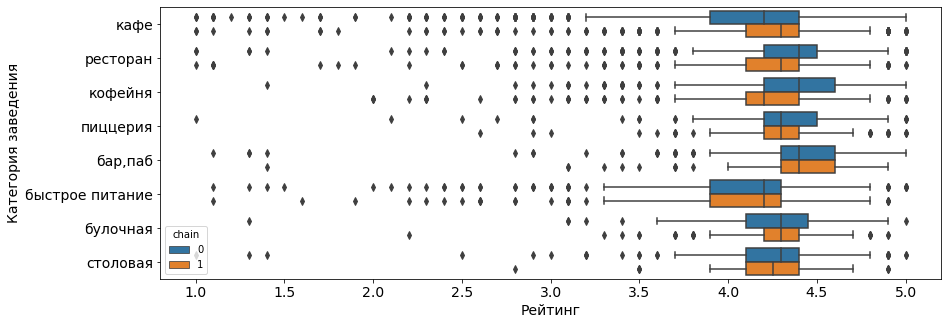

In [521]:
# посмотрим у каких заведений средний рейтинг выше: у сетевых или не сетевых
plt.figure(figsize=(14,5))
sns.boxplot(data=df, x="rating", y="category", hue="chain")
plt.xlabel('Рейтинг', fontsize=14)
plt.ylabel('Категория заведения', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
;

**Выводы**

Для некоторых категорий (кафе, рестораны, кофейни и столовые) есть различия в медианных значениях рейтинга в заисимости от того являются они сетевыми или нет.

Так у сетевых кафе медианный рейтинг выше, чем не у сетевых. Для ресторанов, кофеин и столовых обратная ситуация: у сетевых медианное значение рейтинга ниже, чем не у сетевых заведений той же категории. 

### Пространственное распределение средних рейтингов по округам

Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 

In [522]:
rating_district = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_district['rating'] = round(rating_district['rating'], 2)
rating_district.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [523]:
# импортируем карту и маркер и хороплет
from folium import Map, Marker, Choropleth

# импортируем кластер
from folium.plugins import MarkerCluster

In [524]:
# читаем файл с геоданным и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [525]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

In [526]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

# выводим карту
m

In [527]:
print('Средний рейтинг сетевых заведений', round(df.query('chain == 1')['rating'].mean(),3))
print('Средний рейтинг не сетевых заведений', round(df.query('chain == 0')['rating'].mean(),3))

Средний рейтинг сетевых заведений 4.221
Средний рейтинг не сетевых заведений 4.235


**Выводы**

Усреднённый рейтинг, также, как и в случае с разбивкой по категориям заведений, не сильно отличается от округа к округу. Минимальный рейтинг 4.1 и максимальный 4.38. 

В Центральном АО рейтинг самый высокий, за ним следуют Северный и Северо-западный округа. Самый низкий рейтинг в Юго-Восточном АО.


### Пространственное распределение заведений

In [528]:
object_district = df.groupby('district', as_index=False).agg(count_object=('name','count'))
object_district['ratio'] = round(object_district['count_object']/len(df)*100, 2)
object_district.sort_values(by='count_object', ascending=False)

,district,count_object,ratio
5,Центральный административный округ,2242,26.67
2,Северный административный округ,900,10.71
8,Южный административный округ,892,10.61
3,Северо-Восточный административный округ,891,10.60
1,Западный административный округ,851,10.12
0,Восточный административный округ,798,9.49
6,Юго-Восточный административный округ,714,8.49
7,Юго-Западный административный округ,709,8.43
4,Северо-Западный административный округ,409,4.87


In [529]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=object_district,
    columns=['district', 'count_object'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.5,
    legend_name='Количество заведений по округам', font_size=16
).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

**Выводы**

Больше всего заведений расположено в Центральном АО, в остальных округах, за исключением Северо-Западного, кол-во заведений схоже и варьируется в пределах 709-900. В Северо-Западном АО находится всего 5% заведений от общего числа.  

### Топ-15 улиц по количеству заведений

Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [530]:
#сгрупперуем данные по названию сети и посчитаем кол-во заведений для каждой сети, отсартеруем по убыванию и оставим первые 15
street_top15 = df.groupby('street').agg(count_object=('name', 'count'))\
                      .sort_values(by='count_object', ascending=False).head(15)
street_top15.reset_index(inplace= True)
street_top15

,street,count_object
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [531]:
street15_list = street_top15['street'] # создадим список с названиями улиц, входящих в топ-15

#для этих 15 улиц создадим таблицу с категориями
street15_category = df.query('street in @street15_list').groupby(['street','category'], as_index=False).agg(count_object=('name', 'count'))
street15_category['total_object'] = street15_category.groupby('street')['count_object'].transform(sum)
street15_category['ratio'] = round(street15_category['count_object']/street15_category['total_object']*100, 2)
street15_category.sort_values(by='total_object', ascending=False)


,street,category,count_object,total_object,ratio
92,проспект Мира,быстрое питание,21,184,11.41
97,проспект Мира,столовая,2,184,1.09
95,проспект Мира,пиццерия,11,184,5.98
94,проспект Мира,кофейня,36,184,19.57
93,проспект Мира,кафе,53,184,28.80
...,...,...,...,...,...
76,Пятницкая улица,булочная,3,48,6.25
81,Пятницкая улица,ресторан,18,48,37.50
80,Пятницкая улица,пиццерия,3,48,6.25
79,Пятницкая улица,кофейня,6,48,12.50


Нанесём на карту заведения, расположенные на этих улицах:

In [532]:
fig = px.bar(street15_category.sort_values(by=['total_object']), x='count_object', y='street', 
             color='category', text='count_object')

# оформляем график
fig.update_layout(title={'text':'<b>Количество заведений каждой категории на улицах, входящих в топ-15', 'y':0.92,
        'x':0.52,
        'xanchor': 'center',
        'yanchor': 'top'}, 
        font=dict(family="Arial", size=14),
        xaxis_title='Количество заведений',                   
        yaxis_title='Улица',
        legend_title='Кактегория заведений',
        width=1100, height=550)

fig.show()

In [533]:
fig = px.bar(street15_category.sort_values(by='total_object'), x='ratio', y='street', 
             color='category', text='ratio')

# оформляем график
fig.update_layout(title={'text':'<b>Доля заведений каждой категории на улицах, входящих в топ-15', 'y':0.92,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}, 
        font=dict(family="Arial", size=14),
        xaxis_title='Доля заведений',                   
        yaxis_title='Улица',
        legend_title='Кактегория заведений',
        width=1100, height=550)

fig.show()

* Доля баров и пабов наивысшая на Ленинградском проспекте и Пятницкой улице.
* Доля булочных самая высокая на Пятницкой улице и Ленинградском проспекте.
* Доля заведений быстрого питания самая большая на улице Вавилова, МКАД и Каширском шоссе. 
* Большая доля кафе на МКАД, Люблинской улице и улице Миклухо-Маклая.
* Доля кофеен больше всего на Кутузовском и Ленинградском проспектах.
* Доля пиццерий высокая на Профсоюзной улице и проспекте Вернадского.
* Доля ресторанов наивысшая на Пятницкой улице.
* Доля столовых самая высокая на Варшавском шоссе. А вот на Пятницкой улице, улице Миклухо-Маклая и улице Вавилова вообще отсутствуют столовые. 

Нанесём на карту заведения, расположенные на улицах, входящих в топ-15 по кол-ву заведений:

In [534]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.query('street in @street15_list').apply(create_clusters, axis=1)

# выводим карту
m

In [535]:
# рассмотрим описательные статистики для заведений, расположенных на этих улицах
df.query('street in @street15_list').describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,1258.000000,1258.000000,1258.000000,469.000000,71.000000,1258.000000,775.000000
mean,55.726207,37.580391,4.198569,1057.665245,183.690141,0.428458,163.469677
std,0.085151,0.082013,0.481295,1807.200053,67.219171,0.495052,192.777030
min,55.573942,37.371261,1.000000,50.000000,60.000000,0.000000,0.000000
25%,55.656365,37.517755,4.100000,400.000000,130.000000,0.000000,50.000000
50%,55.699460,37.559444,4.300000,750.000000,180.000000,0.000000,98.000000
75%,55.805797,37.629628,4.400000,1250.000000,247.500000,1.000000,200.000000
max,55.928943,37.839277,5.000000,35000.000000,300.000000,1.000000,1288.000000


In [536]:
# посмотрим к какой ценовой категории относятся заведения
df.query('street in @street15_list').groupby('price')\
        .agg(count_object=('name', 'count')).sort_values(by='count_object', ascending=False)

,count_object
price,
средние,300
выше среднего,85
высокие,72
низкие,22


In [537]:
# посмотрим в каких округах расположены эти улицы
street_district = df.query('street in @street15_list').groupby(['street', 'district']) \
        .agg(count_object=('name', 'count')).sort_values(by='street', ascending=False)
street_district['total_object'] = street_district.groupby('street')['count_object'].transform(sum)
street_district.sort_values(by='total_object', ascending=False)

count_object  \
street                 district                                                
проспект Мира          Центральный административный округ                 52   
                       Северо-Восточный административный округ           132   
Профсоюзная улица      Юго-Западный административный округ               122   
проспект Вернадского   Юго-Западный административный округ                13   
                       Западный административный округ                    95   
Ленинский проспект     Западный административный округ                    21   
                       Центральный административный округ                  8   
                       Юго-Западный административный округ                66   
                       Южный административный округ                       12   
Ленинградский проспект Северный административный округ                    95   
Дмитровское шоссе      Северо-Восточный административный округ            23   
                       Северный административный округ                    65   
Каширское шоссе        Южный административный округ                       77   
Варшавское шоссе       Южный административный округ                       76   
Ленинградское шоссе    Северный административный округ                    70   
МКАД                   Восточный административный округ                    2   
                       Северный административный округ                     2   
                       Западный административный округ                     6   
                       Северо-Западный административный округ              1   
                       Юго-Восточный административный округ               27   
                       Юго-Западный административный округ                 7   
                       Южный административный округ                       13   
                       Северо-Восточный административный округ             7   
Люблинская улица       Юго-Восточный административный округ               60   
улица Вавилова         Южный административный округ                       19   
                       Юго-Западный административный округ                36   
Кутузовский проспект   Западный административный округ                    54   
улица Миклухо-Маклая   Юго-Западный административный округ                49   
Пятницкая улица        Центральный административный округ                 48   

                                                                total_object  
street                 district                                               
проспект Мира          Центральный административный округ                184  
                       Северо-Восточный административный округ           184  
Профсоюзная улица      Юго-Западный административный округ               122  
проспект Вернадского   Юго-Западный административный округ               108  
                       Западный административный округ                   108  
Ленинский проспект     Западный административный округ                   107  
                       Центральный административный округ                107  
                       Юго-Западный административный округ               107  
                       Южный административный округ                      107  
Ленинградский проспект Северный административный округ                    95  
Дмитровское шоссе      Северо-Восточный административный округ            88  
                       Северный административный округ                    88  
Каширское шоссе        Южный административный округ                       77  
Варшавское шоссе       Южный административный округ                       76  
Ленинградское шоссе    Северный административный округ                    70  
МКАД                   Восточный административный округ                   65  
                       Северный административный округ                    65  
                       Западный административный округ                    65  
   

In [538]:
# Посчитаем сколько улиц-лидеров по кол-ву заведений находится в каждом округе
street_district.groupby('district').count().sort_values(by='count_object', ascending=False)

,count_object,total_object
district,,
Юго-Западный административный округ,6,6
Южный административный округ,5,5
Западный административный округ,4,4
Северный административный округ,4,4
Северо-Восточный административный округ,3,3
Центральный административный округ,3,3
Юго-Восточный административный округ,2,2
Восточный административный округ,1,1
Северо-Западный административный округ,1,1


**Выводы**

Абсолютный лидер по кол-ву заведений - проспект Мира на северо-востоке Москвы. На нём расположено 184 заведения. В целом в топ-15 вошли крупные магистрали - проспекты и шоссе, в основном расположенные в северной и юго-западной частях Москвы. Восточный и Северо-Западный АО вошли в рейтинг за счёт МКАД, ни одной улицы/проспекта из этих округов не вошли в топ-15. 

Если говорить про категории заведений, то в целом, хоть доли и варьируются от улицы к улице, для всех 15 улиц преобладают кафе, кофейни и рестораны. Меньше заведений быстрого питания,столовых, пиццерий и баров и пабов. Доля булочных наименьшая.

Стоит отметить, что МКАД выделяется по кол-во кофеин, почти 70% заведений относятся к этой категории, и практически полным отсутствием баров и пабов и небольшой долей кофеин. Также выделяются Ленинградский проспект и Пятницкая улица по доле баров и пабов (18.2% и 17ю4% соответственно), для остальных улиц процент баров не превышает 10.

Если говорить о кол-ве посадочных мест и среднем чеке, то какой-то общей закономерности не прослеживается. Эти параметры варьируются в довольно широких пределах:
* средний чек (middle_avg_bill) меняется в пределах от 50 рубелей до 35000,
* стоимость чашки капучино 60-300 рублей,
* кол-во посадочных мест 0-1288.


### Улицы только с одним заведением

In [539]:
# сохраним в отдельную переменную таблицу сгруппированную по названиям улиц
street_all = df.groupby('street', as_index=False).agg(count_object=('name', 'count'))\
                      .sort_values(by='count_object', ascending=False)
#street_all.reset_index(inplace= True)
street_one_list = street_all.query('count_object == 1')['street'] #сохраним названия улиц с одним заведением в список

#  запишем в отдельный датафрейм данные для улиц с одним заведением
lonly_object = df.query('street in @street_one_list')
lonly_object


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,Мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица Шкулёва,False
8294,WTFcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False


Посмотрим на пространственное распределение этих улиц:

In [540]:

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
lonly_object.apply(create_clusters, axis=1)

# выводим карту
m

In [541]:
# посмотрим какие категории заведений встречаются на улицах с одним заведением
lonly_object.groupby('category').agg(count_object=('name', 'count')).sort_values(by='count_object', ascending=False)

,count_object
category,
кафе,160
ресторан,93
кофейня,84
"бар,паб",39
столовая,36
быстрое питание,23
пиццерия,15
булочная,8


In [542]:
fig = px.bar(lonly_object.groupby('category', as_index=False).agg(count_object=('name', 'count')).sort_values(by='count_object'),      
 x='count_object',   
 y='category',      
 text='count_object')

# оформляем график
fig.update_layout(title={'text':'<b>Количество объектов по категориям заведений', 'y':0.92,
        'x':0.52,
        'xanchor': 'center',
        'yanchor': 'top'}, font=dict(
            family="Arial",
            size=14),
            xaxis_title='Количество объектов',                   
            yaxis_title='Категория', width=720, height=450)
fig.show()

In [543]:
lonly_object.describe()


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,458.000000,458.000000,458.000000,165.000000,24.000000,458.000000,156.000000
mean,55.760131,37.617146,4.236681,959.830303,186.166667,0.290393,59.115385
std,0.063903,0.093523,0.461952,999.518083,55.544472,0.454440,48.274880
min,55.578830,37.387459,1.000000,67.000000,95.000000,0.000000,0.000000
25%,55.729272,37.561486,4.100000,325.000000,140.000000,0.000000,30.000000
50%,55.760801,37.612995,4.300000,625.000000,177.500000,0.000000,45.000000
75%,55.795678,37.667302,4.500000,1250.000000,213.750000,1.000000,80.000000
max,55.914074,37.867004,5.000000,7000.000000,320.000000,1.000000,240.000000


In [544]:
# посмотрим к какой ценовой категории относятся заведений
lonly_object.groupby('price').agg(count_object=('name', 'count')).sort_values(by='count_object', ascending=False)

,count_object
price,
средние,120
выше среднего,29
высокие,22
низкие,11


In [545]:
# есть ли заведения, которые работают 24/7
print('Кол-во заведений, работающих 24/7:', len(lonly_object[lonly_object['is_24/7']==True]))


Кол-во заведений, работающих 24/7: 31


**Выводы**

Всего в данных встречаются 458 улиц с одним заведением. 

В основном улицы с одним заведением расположены в центральной части Москвы, но встречаются во всех административных округа. 

Наиболее частая категория среди этих заведений - кафе, с большим отрывом следуют кофейни. Меньше всего пиццерий и булочных.

Также, как и для топ-15 улиц, значения среднего чека, стоимости одной чашки капучино и кол-ва посадочных мест варьируются в широких пределах от заведения к заведению. Однако, большинство заведений (для которых есть данные) относятся к средней ценовой категории. 

Только 31 заведения из 458 работают круглосуточно и ежедневно.


### Пространственное распределение среднего чека по округам


Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях.


In [546]:
bill_district = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
bill_district.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [547]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.5,
    legend_name='Медианное значение среднего чека заведений по районам',
).add_to(m)

# выводим карту
m

**Выводы**

Наивысшее значение медианы среднего чека в Центральном АО, за ним следует Западный округ.
Северо-Западный, Северный, Восточный и Юго-Западный АО занимают промежуточное положение, а в Северо-Восточном, Южном и Юго-Восточном АО средний чек наименьший. 

В целом, можно сделать вывод, что в более крупных и более удалённых от центра округах средний чек ниже.

Прослеживается взаимосвязь с плотностью населения. (см. карта из пункта 3.12)

### Население Москвы

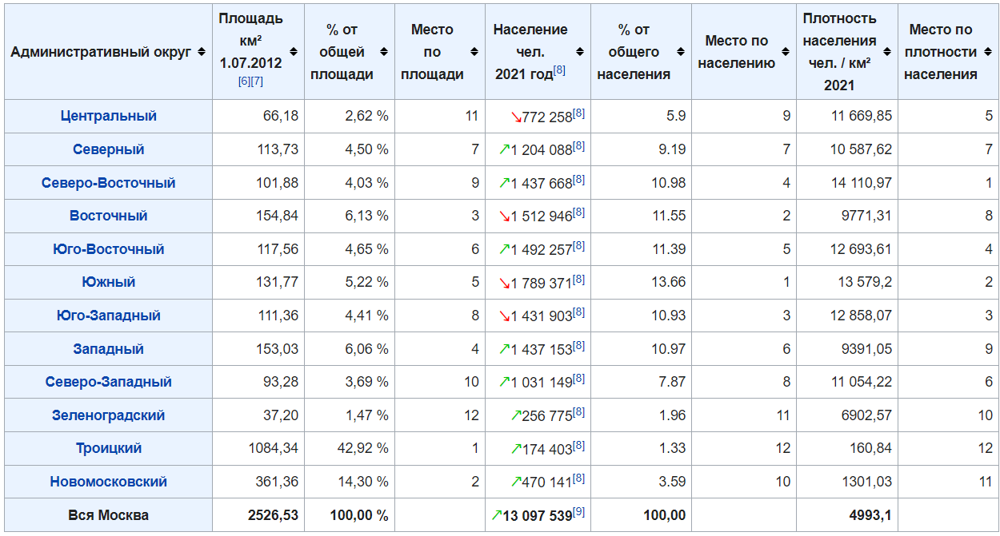

https://ru.wikipedia.org/wiki/%D0%90%D0%B4%D0%BC%D0%B8%D0%BD%D0%B8%D1%81%D1%82%D1%80%D0%B0%D1%82%D0%B8%D0%B2%D0%BD%D0%BE-%D1%82%D0%B5%D1%80%D1%80%D0%B8%D1%82%D0%BE%D1%80%D0%B8%D0%B0%D0%BB%D1%8C%D0%BD%D0%BE%D0%B5_%D0%B4%D0%B5%D0%BB%D0%B5%D0%BD%D0%B8%D0%B5_%D0%9C%D0%BE%D1%81%D0%BA%D0%B2%D1%8B

In [548]:
moscow = pd.DataFrame()
moscow['district'] = [
    'Центральный административный округ', 'Северный административный округ', 
    'Северо-Восточный административный округ', 'Восточный административный округ', 
    'Юго-Восточный административный округ', 'Южный административный округ', 
    'Юго-Западный административный округ', 'Западный административный округ', 
    'Северо-Западный административный округ'
]

#население на 2021 год 
moscow['population'] = [772258,
1204088,
1437668,
1512946,
1492257,
1789371,
1431903,
1437153,
1031149
]

#  данные о плотности населения за 2021 год, чел/км2
moscow['p_density'] = [11669.85, 
10587.62,
14110.97,
9771.31,
12693.61,
13579.2,
12858.07,
9391.05,
11054.22
]

moscow['square, km2'] =[66.18,
113.73,
101.88,
154.84,
117.56,
131.77,
111.36,
153.03,
93.28
]

moscow.sort_values(by='p_density', ascending=False)

,district,population,p_density,"square, km2"
2,Северо-Восточный административный округ,1437668,14110.97,101.88
5,Южный административный округ,1789371,13579.20,131.77
6,Юго-Западный административный округ,1431903,12858.07,111.36
4,Юго-Восточный административный округ,1492257,12693.61,117.56
0,Центральный административный округ,772258,11669.85,66.18
8,Северо-Западный административный округ,1031149,11054.22,93.28
1,Северный административный округ,1204088,10587.62,113.73
3,Восточный административный округ,1512946,9771.31,154.84
7,Западный административный округ,1437153,9391.05,153.03


In [549]:
print('Средняя плотность населения:', round(moscow['p_density'].mean(),2))

Средняя плотность населения: 11746.21


In [550]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=moscow,
    columns=['district', 'p_density'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.5,
    legend_name='Плотность населения по округам, чел./км2',
).add_to(m)

# выводим карту
m

**Выводы**

Наиболее густонаселённые округа Москвы - это:
* Западный административный округ	
* Восточный административный округ	
* Северный административный округ	
* Северо-Западный административный округ	

### Кол-во завнднний относительно кол-ва населения

Посчитаем по окргуам соотношение кол-ва заведений к населению. 

In [551]:
# объеденим таблицы moscow и object_district из пункта 3.8

moscow = moscow.merge(object_district, on='district')
moscow = moscow.drop(columns = 'ratio')



In [552]:
# добавляем столбец с соотношением 
moscow['object/population'] = moscow['count_object']/moscow['population']
# кол-во заведений на км2 
moscow['object_density'] = round(moscow['count_object']/moscow['square, km2'])
moscow.sort_values(by='object/population', ascending=False)

,district,population,p_density,"square, km2",count_object,object/population,object_density
0,Центральный административный округ,772258,11669.85,66.18,2242,0.002903,34.0
1,Северный административный округ,1204088,10587.62,113.73,900,0.000747,8.0
2,Северо-Восточный административный округ,1437668,14110.97,101.88,891,0.000620,9.0
7,Западный административный округ,1437153,9391.05,153.03,851,0.000592,6.0
3,Восточный административный округ,1512946,9771.31,154.84,798,0.000527,5.0
5,Южный административный округ,1789371,13579.20,131.77,892,0.000498,7.0
6,Юго-Западный административный округ,1431903,12858.07,111.36,709,0.000495,6.0
4,Юго-Восточный административный округ,1492257,12693.61,117.56,714,0.000478,6.0
8,Северо-Западный административный округ,1031149,11054.22,93.28,409,0.000397,4.0


In [553]:
# уберём центральный АО из данных, чтобы на визуализации было видно разницу между другими округами 
moscow2 = moscow.loc[1:, :]
moscow2

,district,population,p_density,"square, km2",count_object,object/population,object_density
1,Северный административный округ,1204088,10587.62,113.73,900,0.000747,8.0
2,Северо-Восточный административный округ,1437668,14110.97,101.88,891,0.000620,9.0
3,Восточный административный округ,1512946,9771.31,154.84,798,0.000527,5.0
4,Юго-Восточный административный округ,1492257,12693.61,117.56,714,0.000478,6.0
5,Южный административный округ,1789371,13579.20,131.77,892,0.000498,7.0
6,Юго-Западный административный округ,1431903,12858.07,111.36,709,0.000495,6.0
7,Западный административный округ,1437153,9391.05,153.03,851,0.000592,6.0
8,Северо-Западный административный округ,1031149,11054.22,93.28,409,0.000397,4.0


In [554]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=moscow2,
    columns=['district', 'object/population'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.5,
    legend_name='Соотношение числа заведений к населению'
).add_to(m)

# выводим карту
m

**Выводы**

Соотношение числа заведений к населению административных округов варьируется от округа к округу. Выделяется Центральный АО, являющимся не самым густонаселённым округом, но при этом с большим кол-вом заведений общественного питания. За Центральным АО следуют Северный, Северо-Восточный и Западный АО. Меньше всего заведений на кол-во населений в Северо-Западном АО.

### Часы работы заведений

Рассмотрим какие часы работы наиболее популярные среди заведений

Посчитаем соотношение работающих 24/7 и работающих по другому режиму

Посмотрим есть ли взаимосвязь режима работы и расположения заведений. Найдем в каком округе доля работающих 24/7 самая большая

Среди каких категорий заведений больше всего заведений работающих круглосуточно?


Кол-во уникальных режимов работы заведений: 1257

In [555]:
# найдём наиболее часто встречающиеся в данных часы работы
hours_grouped = df.groupby('hours', as_index=False).agg(count_object=('name', 'count'))\
                        .sort_values(by='count_object', ascending=False).head(10)
hours_grouped['ratio'] = round(hours_grouped['count_object']/len(df['name'])*100, 2)
hours_grouped

,hours,count_object,ratio
168,"ежедневно, 10:00–22:00",759,9.03
275,"ежедневно, круглосуточно",730,8.68
213,"ежедневно, 11:00–23:00",396,4.71
175,"ежедневно, 10:00–23:00",310,3.69
229,"ежедневно, 12:00–00:00",254,3.02
132,"ежедневно, 09:00–21:00",204,2.43
134,"ежедневно, 09:00–22:00",184,2.19
245,"ежедневно, 12:00–23:00",178,2.12
103,"ежедневно, 08:00–23:00",160,1.90
100,"ежедневно, 08:00–22:00",148,1.76


In [556]:
# найдём в каком округе больше всего заведений, работающих 24/7
hours24_district = df[df['is_24/7']==True].groupby('district', as_index=False).agg(count_object=('name', 'count'))\
                        .sort_values(by='count_object', ascending=False)
hours24_district

,district,count_object
5,Центральный административный округ,131
0,Восточный административный округ,97
6,Юго-Восточный административный округ,93
3,Северо-Восточный административный округ,75
8,Южный административный округ,75
7,Юго-Западный административный округ,73
1,Западный административный округ,72
2,Северный административный округ,71
4,Северо-Западный административный округ,43


In [557]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=hours24_district,
    columns=['district', 'count_object'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.5,
    legend_name='Кол-во заведений, работающих ежедневно и круглосуточно',
).add_to(m)

# выводим карту
m

### Общий вывод по разделу

После этапа предобработки был проведён анализ 8406 заведений общественного питания Москвы. 
Всего в данных представлено 8 типов заведений:
*	булочная	
*	столовая	
*	быстрое питание	
*	пиццерия
*	бар,паб	
*	кофейня	
*	ресторан	
*	кафе

Наиболее часто встречающаяся категория – это кофе (28.3% от общего числа заведений). За ней следуют рестораны (24.3%) и кофейни (16.8%). Реже всего встречаются булочные (3.1%).

Количество посадочных мест варьируется в зависимости от категории. Больше всего посадочных мест в ресторанах и барах, пабах (медианное значение - 86 и 82.5 посадочных мест), а меньше всего в булочных (50 посадочных мест). В целом, для всего набора данных медианное значение кол-ва посадочных мест – 75. Максимальное 1288 и минимальное 0. 

Среди представленных заведений преобладают не сетевые (61,9%), остальные заведения относятся к сетевым. 

Чаще всего сетевыми являются булочные. 61,3% булочных из датасета являются сетевыми. А реже всего категория бар, паб. Только 22.1% заведений данной категории являются сетевыми. 

В топ-15 по популярности входят такие известные сети как Шоколадница (120 заведений в Москве), Домино’c Пицца (76 заведений), Додо Пицца (72 заведения) и так далее.

Эти топ-15 сетей объединяют некоторые общие характеристики. 
*	Чаще всего заведения относятся к категориям кафе, кофейня и пиццерия.
*	Большинство из них относятся к средней и/или низкой ценовой категории.

А вот категория "паб, бар" встречается только один раз, для сети "Му-Му".

Перейдём к пространственному распределению заведений. 

Абсолютный лидер по кол-ву заведений - Центральный АО. В остальных округах заведений общественного питания более чем в половину меньше.

Распределение заведений по категориям в различных округах схожее. Во всех округах чаще всего встречаются кафе, рестораны и кофейни и меньше всего булочных и столовых. Однако есть некоторые особенности: 
*	Центральный АО выделяется по количеству баров и пабов. Доля этой категории в два раза больше, чем для остальных округов.

Средние рейтинги заведений в зависимости от категории варьируется в пределах 4,05-4,39. Наивысший усреднённый рейтинг у категории «бар, паб», а наименьший у заведений быстрого питания. 

Если рассматривать пространственное распределение средних рейтингов, то тут также рейтинги варьируются в небольших пределах от округа к округу (4,1 – 4,38). Наивысший усреднённый рейтинг у заведений Центрального АО. За ним следуют Северный и Северо-Западный АО. Худший средний рейтинг у заведений Юго-Восточного АО. 

Больше всего заведений расположено в Центральном АО – 26.7% от общего числа заведений. С большим отрывом за ним следуют Северо-Восточный, Северный и Западный административные округа. В каждом из них около 10% от общего кол-ва заведений. Меньше всего заведений, 5%, в Северо-Западном АО. Взаимосвязи между кол-вом заведений и плотностью населения не прослеживается. 

Абсолютный лидер по кол-ву заведений - проспект Мира на северо-востоке Москвы. На нём расположено 184 заведений.  В целом чаще всего большое кол-во заведений расположено на протяженных улицах, проспектах и шоссе. Среди лидеров по кол-ву заведений Профсоюзная улица, Ленинский проспект, Проспект Вернадского, Варшавское шоссе, Дмитровское шоссе и т.д. В основном улицы из топ-15 по кол-ву заведений расположены в северной и южной частях Москвы. 

На улицах, входящих в топ-15 по кол-ву заведений, преобладают кафе, кофейни и рестораны. МКАД выделяется по кол-ву кафе – почти 70% заведений, расположенных на нём, относятся к этой категории. А вот по кол-ву баров и пабов выделяются Ленинградский проспект и Пятницкая улица. Доля кофеен самая высокая на Ленинградском проспекте (26%) и Кутузовском проспекте (24%), а наименьшая на МКАД и улице Миклухо-Маклая. 

В основном заведений, расположенные на улицах из топ-15, относятся к средней ценовой категории. 

В датасете также есть улицы, на которых расположено только по одному заведению. Всего таких улиц 458. Такие улицы встречаются по всей Москве, но больше всего их в пределах Третьего Транспортного кольца. Наиболее часто категория этих заведений – это кафе, кофейни и рестораны. Также эти заведения чаще относятся к средней ценовой категории. Только 31 заведения из 458 работают ежедневно и круглосуточно. 

Перейдем к пространственному распределению среднего чека. Самый высокий средний чек в Центральном АО. Также во всей западной части Москвы средний чек выше, чем в восточной. 
Можно проследить определённую зависимость между плотностью населения и средним чеком, в округах, где плотность населения больше, средний чек ниже.

После Центрального АО, наибольшее кол-во заведений на кол-во населений приходится Северный, Северо-Восточный и Западный округа. 
Наиболее частый режим работы заведений – это ежедневно, 10:00–22:00. 9.3% заведений работают в таком режиме. На втором месте по частоте заведения, работающие ежедневно и круглосуточно (8.8%). Всего в данных встречается 1252 вариации режима работы. 

Кол-во заведений, работающих ежедневно и круглосуточно, больше всего в Центральном АО, а меньше всего в Северо-Западном. 


----

## Детализированное исследование: открытие кофейни

Цель заказчиков исследования — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Помимо подробного изучения рынка общественного питания Москвы они хотят получить отдельно данные по кофейням в Москве:

* Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
* Есть ли круглосуточные кофейни?
* Какие у кофеен рейтинги? Как они распределяются по районам?
* На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

и т.д..

### Сколько всего кофеен

In [558]:
# для удобства запишем в отдельный датасет данные о кофейнях 
cofe_df = df.query('category == "кофейня"')
print('Всего кофеен в датасете:', len(cofe_df))

Всего кофеен в датасете: 1413


### Количество сетевых кофеен

In [559]:
print('Кол-во сетевых кофеен в датасете:', len(cofe_df.query('chain == 1')))

Кол-во сетевых кофеен в датасете: 720


In [560]:
# найдём наиболее популярные сетевые кофейни
cofe_df.groupby('name', as_index=False)\
       .agg(count_object=('name', 'count')).sort_values(by='count_object', ascending=False).head(10).reset_index()

,index,name,count_object
0,825,Шоколадница,119
1,307,One Price Coffee,71
2,145,Cofix,65
3,524,КОФЕПОРТ,42
4,87,CofeFest,31
5,621,Кофемания,22
6,80,Cinnabon,20
7,717,Правда кофе,12
8,250,Krispy Kreme,9
9,601,Кофейня,9


In [561]:
1413/720

1.9625

**Выводы**
Всего в датасете 1413 кофеен, примерно половина из них является сетевыми. Лидер среди сетей - Шоколадница.

### Пространственное распределение кофеен

In [562]:
cofe_district = cofe_df.groupby('district', as_index=False).agg(count_object=('name', 'count'))
cofe_district['ratio'] =  round(cofe_district['count_object']/len(cofe_df)*100, 2)

cofe_district.sort_values(by='count_object', ascending=False)

,district,count_object,ratio
5,Центральный административный округ,428,30.29
2,Северный административный округ,193,13.66
3,Северо-Восточный административный округ,159,11.25
1,Западный административный округ,150,10.62
8,Южный административный округ,131,9.27
0,Восточный административный округ,105,7.43
7,Юго-Западный административный округ,96,6.79
6,Юго-Восточный административный округ,89,6.30
4,Северо-Западный административный округ,62,4.39


Посмотрим на пространственное распределение кофеен в Москве: 

In [563]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofe_district,
    columns=['district', 'count_object'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.5,
    legend_name='Количество кофеен по округам',
).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cofe_df.apply(create_clusters, axis=1)

# выводим карту
m

In [564]:
cofe_df.query('chain == 1').groupby('district', as_index=False).agg(count_object=('name', 'count'))\
       .sort_values(by='count_object', ascending=False)

,district,count_object
5,Центральный административный округ,221
2,Северный административный округ,97
1,Западный административный округ,93
3,Северо-Восточный административный округ,79
8,Южный административный округ,66
0,Восточный административный округ,51
7,Юго-Западный административный округ,50
4,Северо-Западный административный округ,34
6,Юго-Восточный административный округ,29


In [565]:
cofe_df.query('chain == 1').groupby('district', as_index=False).agg(count_object=('name', 'count'))['count_object'].mean()

80.0

**Выводы**

30% всех кофеен Москвы находятся в Центральном АО. За ним следуют:

* Северный административный округ - 13.66%
* Северо-Восточный административный округ - 11.25%
* Западный административный округ	- 10.62%.

В остальных округах Москвы кофеен значительно меньше, менее 10% от общего числа. 

Сетевые кофейни также чаще встречаются в Центральном АО.



### Круглосуточные кофейни

In [566]:
print('Кол-во круглосуточных кофеен:', len(cofe_df[cofe_df['is_24/7']==True]))
print('Процент от общего числа:',  round(len(cofe_df[cofe_df['is_24/7']==True])/ len(cofe_df)*100, 2))

Кол-во круглосуточных кофеен: 59
Процент от общего числа: 4.18


In [567]:
# посмотрим в каких округах встречаются кофейни, работающие 24/7
cofe24_district = cofe_df[cofe_df['is_24/7']==True].groupby('district', as_index=False).agg(count_object=('name', 'count'))\
                                 .sort_values(by='count_object', ascending=False)
cofe24_district['ratio'] = round(cofe24_district['count_object']/len(cofe_df[cofe_df['is_24/7']==True])*100, 2)
cofe24_district

,district,count_object,ratio
5,Центральный административный округ,26,44.07
1,Западный административный округ,9,15.25
7,Юго-Западный административный округ,7,11.86
0,Восточный административный округ,5,8.47
2,Северный административный округ,5,8.47
3,Северо-Восточный административный округ,3,5.08
4,Северо-Западный административный округ,2,3.39
6,Юго-Восточный административный округ,1,1.69
8,Южный административный округ,1,1.69


**Выводы**

Всего в датасете 59 кофеен, работающих круглосуточно. Большинство из них, 44%, находятся в Центральном АО. 

### Наиболее частый режим работы среди кофеен

In [568]:
# сколько разных режимов работы встречается среди кофеен
len(cofe_df['hours'].unique())

363

In [569]:
cofe_df.groupby('hours').agg(count_object=('name', 'count'))\
                        .sort_values(by='count_object', ascending=False).head(20)

,count_object
hours,
"ежедневно, 10:00–22:00",140
"ежедневно, 08:00–22:00",60
"ежедневно, круглосуточно",59
"ежедневно, 09:00–22:00",57
пн-пт 08:00–19:00,46
"пн-пт 08:00–21:00; сб,вс 09:00–21:00",46
"ежедневно, 09:00–21:00",43
"пн-пт 08:00–22:00; сб,вс 09:00–22:00",42
"ежедневно, 08:00–21:00",36


In [570]:
cofe_df[cofe_df['hours'].str.contains('08', na=False)]['hours'].count()

709

In [571]:
cofe_df[cofe_df['hours'].str.contains('06', na=False)]['hours'].unique()

array(['пн-пт 06:30–21:30; сб 07:30–21:30; вс 08:30–21:30',
       'ежедневно, 06:55–22:05', 'ежедневно, 06:30–22:30',
       'пн 06:00–00:00; вт-вс круглосуточно',
       'пн-пт 06:30–23:00; сб,вс 07:00–23:00'], dtype=object)

In [572]:
cofe_df[cofe_df['hours'].str.contains('06', na=False)]['hours'].count()

8

In [573]:
cofe_df[cofe_df['hours'].str.contains('07', na=False)]['hours'].count()

207

**Выводы**

Режим работы кофеен варьируется довольно в широких пределах: в данных встречается 363 уникальных режима работы. Однако, все же можно выделить несколько наиболее часто встречающихся:
* ежедневно, 10:00–22:00 (самый частый)
* ежедневно, 08:00–22:00
* ежедневно, круглосуточно	
* ежедневно, 09:00–22:00

Около половины кофеен открываются в 8 утра как минимум в некоторые дни недели. 

### Рейтинг кофеен и его пространственное распределение

In [574]:
cofe_df['rating'].describe()

count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

In [575]:
rating_cofe_district = cofe_df.groupby('district', as_index=False)['rating'].agg('mean')
rating_cofe_district['rating'] = round(rating_cofe_district['rating'], 2)
rating_cofe_district.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [576]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cofe_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Средний рейтинг кофеен по округам',
).add_to(m)

# выводим карту
m

In [577]:
print('Кол-во кофеен с рейтингом 4 и выше:', len(cofe_df.query('rating >= 4')))
print('Процент от общего числа кофеен:', round(len(cofe_df.query('rating >= 4'))/len(cofe_df)*100, 2))

Кол-во кофеен с рейтингом 4 и выше: 1275
Процент от общего числа кофеен: 90.23


In [578]:
print('Кол-во кофеен с низким рейтингом:', len(cofe_df.query('rating < 3')))
print('Процент от общего числа кофеен:', round(len(cofe_df.query('rating < 3'))/len(cofe_df)*100, 2))

Кол-во кофеен с низким рейтингом: 16
Процент от общего числа кофеен: 1.13


In [579]:
# В каких округах встречаются кофейни с низким рейтингом
cofe_df.query('rating < 3')['district'].unique()

array(['Северо-Восточный административный округ',
       'Северный административный округ',
       'Северо-Западный административный округ',
       'Центральный административный округ',
       'Юго-Восточный административный округ',
       'Западный административный округ', 'Южный административный округ'],
      dtype=object)

**Выводы**

От округа к округу средний рейтинг меняется не очень сильно и 90% всех кофеен имеют рейтинг равный или выше 4. Кофеен с низким рейтингом (меньше 3) очень мало - всего 16. Кофейни с низким рейтингом встречаются во всех АО, кроме Восточного. 
Выше всего рейтинг у кофеен Центрального, Северо-Западного и Северного округов, а самый низкий рейтинг у кофеен Западного АО.

Возможно относительно более низкий рейтинг в Западном АО связан с тем, что там много сетевых кофеен. А у сетевых кофеен медианное значение рейтинга ниже, чем не у сетевых (см. пункт 3.6 ящик с усами).


### Стоимость чашки капучино

In [580]:
cofe_df['middle_coffee_cup'].describe()

count    520.000000
mean     172.376923
std       65.767854
min       60.000000
25%      124.000000
50%      169.500000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

In [581]:
# не сетевые кофейни
cofe_df.query('chain == 0')['middle_coffee_cup'].describe()

count    263.000000
mean     177.300380
std       51.882548
min       60.000000
25%      139.500000
50%      170.000000
75%      210.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

In [582]:
cup_cofe_district = cofe_df.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
cup_cofe_district.sort_values(by='middle_coffee_cup', ascending=False)

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [583]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cup_cofe_district,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.5,
    legend_name='Медианная стоимость одной чашки капучино по округам',
).add_to(m)

# выводим карту
m

Посмотрим отличается ли стоимость чашки капучино в сетевых и не сетевых кофейнях:

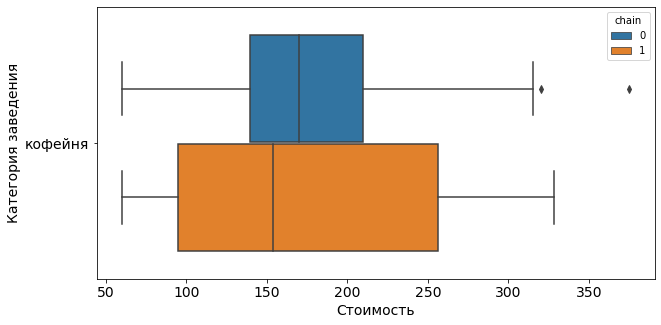

In [584]:
plt.figure(figsize=(10,5))
sns.boxplot(data=cofe_df, x="middle_coffee_cup", y="category", hue='chain')
plt.xlabel('Стоимость', fontsize=14)
plt.ylabel('Категория заведения', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14);

**Выводы**

Стоимость чашки капучино в кофейнях варьируется от 60 до 375 рублей. Медиана - 169 рублей. 
Медианное значение стоимости чашки варьируется в зависимости от округа. Наиболее дорогой капучино в Юго-Западном АО, а наиболее дешёвый в Восточном. В целом в западной части Москвы медианная стоимость чашки капучино выше, чем восточной. 

Также есть отличия между сетевыми и не сетевыми кофейнями. В сетевых кофейнях стоимость чашки варьируется в более широких пределах (примерно от 100  до 255 рублей), чем в не сетевых (примерно между 140-210 рублей), а медианное значение стоимости ниже. 



### Средний чек

In [585]:
cofe_df['middle_avg_bill'].describe()

count     200.000000
mean      614.210000
std       501.083154
min         0.000000
25%       300.000000
50%       400.000000
75%       750.000000
max      2500.000000
Name: middle_avg_bill, dtype: float64

In [586]:
bill_cofe_district = cofe_df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
bill_cofe_district.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,600.0
5,Центральный административный округ,500.0
0,Восточный административный округ,400.0
8,Южный административный округ,387.5
7,Юго-Западный административный округ,375.0
2,Северный административный округ,325.0
3,Северо-Восточный административный округ,325.0
4,Северо-Западный административный округ,325.0
6,Юго-Восточный административный округ,250.0


In [587]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill_cofe_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.5,
    legend_name='Медианное значение среднего чека по округам',
).add_to(m)

# выводим карту
m

**Выводы**

По Москве медианное значение среднего чека - 400 рублей.

Самое высокое значение медианного среднего чека в Западном АО.
За ним следуют Центральный и Восточный АО.
Самый низкое значение в Юго-Восточном АО.


### Взаимосвязи между параметрами

In [588]:
cofe_df.corr().style.format("{:.3f}").background_gradient(cmap='Blues', axis=1).highlight_max(color='white')

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
lat,1.000,-0.119,0.020,0.010,-0.020,-0.020,-0.057
lng,-0.119,1.000,0.045,-0.085,-0.112,-0.100,-0.103
rating,0.020,0.045,1.000,0.190,0.146,-0.193,-0.048
middle_avg_bill,0.010,-0.085,0.190,1.000,nan,0.267,0.059
middle_coffee_cup,-0.020,-0.112,0.146,nan,1.000,-0.076,-0.016
chain,-0.020,-0.100,-0.193,0.267,-0.076,1.000,0.088
seats,-0.057,-0.103,-0.048,0.059,-0.016,0.088,1.000


**Наюлюдения**

Есть слабая взаимосвязь между столбцом:
* chain и middle_avg_bill
* rating и middle_avg_bill
* rating и middle_coffee_cup	
* chain и rating (отрицательная в этом случае, в пункте 3.6 уже видели что у сетевых кофеен рейтинг значительно ниже, чем у не сетевых)

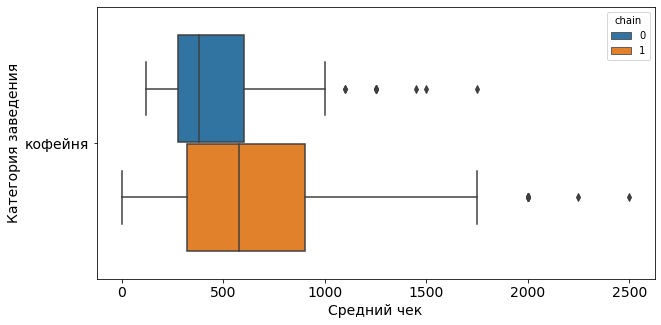

In [589]:
plt.figure(figsize=(10,5))
sns.boxplot(data=cofe_df, x="middle_avg_bill", y="category", hue='chain')
plt.xlabel('Средний чек', fontsize=14)
plt.ylabel('Категория заведения', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14);

**Выводы:** у сетевых кофеен медианное значение среднего чека выше, а также больше межквартильный размах, т.е. значения среднего чека меняются в более широких пределах, чем у не сетевых.


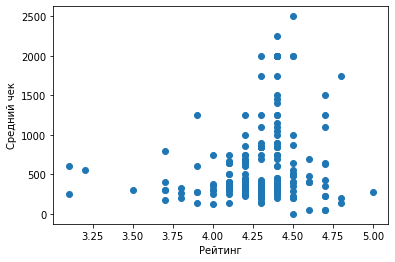

In [590]:
# построим точечную диаграмму, чтобы посмотреть на взаимосвязь рейтинга и среднего чека
plt.scatter(x=cofe_df['rating'], y=cofe_df['middle_avg_bill'])
plt.xlabel('Рейтинг')
plt.ylabel('Средний чек');

**Выводы:** облако довольно рассеяное, но можно проследить слабовыраженную тенднцию к росту среднего чека при росте рейтинга. 

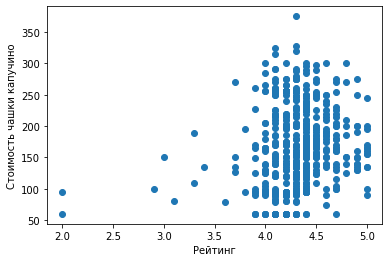

In [591]:
# построим точечную диаграмму, чтобы посмотреть на взаимосвязь рейтинга и стоимости чашки капучино
plt.scatter(x=cofe_df['rating'], y=cofe_df['middle_coffee_cup'])
plt.xlabel('Рейтинг')
plt.ylabel('Стоимость чашки капучино');

**Выводы:** основная масса точек сконцентрирована в районе значений 4-5 для рейтинга (как мы ранее посчитали, 90% кофеен имеют высокий рейтинг: 4 и выше). Чёткой взаимосвязи между стоимостью чашки кофе и рейтингом не прослеживается.

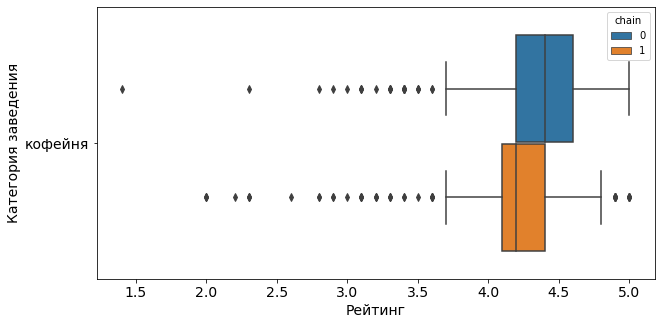

In [592]:
plt.figure(figsize=(10,5))
sns.boxplot(data=cofe_df, x="rating", y="category", hue='chain')
plt.xlabel('Рейтинг', fontsize=14)
plt.ylabel('Категория заведения', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14);

In [593]:
cofe_df.groupby('chain')['rating'].mean()

chain
0    4.350505
1    4.206806
Name: rating, dtype: float64

**Выводы:** у сетевых кофеен средний рейтинг ниже, чем у несетевых. 

### Количество посадочных мест

In [594]:
cofe_df['seats'].describe()

count     751.000000
mean      111.199734
std       127.837772
min         0.000000
25%        40.000000
50%        80.000000
75%       144.000000
max      1288.000000
Name: seats, dtype: float64

In [595]:
cofe_df.groupby('chain')['seats'].median()

chain
0    60.0
1    90.0
Name: seats, dtype: float64

**Выводы:** в сетевых кофейнях больше посадочных мест, чем в не сетевых.

### Общие выводы по разделу

Всего в датасете 1413 кофеен – это 17% от общего числа заведений. Из них около половины являются сетевыми. Больше всего заведений относится к сети Шоколадница.

30% всех кофеен расположено в Центральном АО. За ним следует с большим отрывом Северный АО с 13.7% кофеен, Северо-Восточный АО с 11.3% и Западный с 10.6%. В остальных процент кофеен ниже 10%. Меньше всего кофеен в Северо-Западном АО. Сетевых кофеен также больше всего в Центральном АО, а меньше всего в Юго-Восточном. 

Только 4% кофеен работают ежедневно и круглосуточно. 44% кофеен с таким режимом работы находятся в Центральном АО. Чаще всего встречаются кофейни с режимом работы ежедневно, 10:00–22:00. Примерно половина кофеен (688 штуки) открываются в 8 утра каждый день или в некоторые дни недели. 

У 90% кофеен высокий рейтинг (4 и выше). Наиболее высокий средний рейтинг у кофеен Центрального и Северо-Западного АО, а наиболее низкий у кофеен Западного АО. В Западном АО довольно высокая доля сетевых кофеен, а у сетевых кофеен рейтинг значительно ниже, чем не у сетевых. Только у 1% кофеен рейтинг ниже 3. Кофейни с низким рейтингом встречаются во всех округах, кроме Восточного.

Стоимость чашки капучино варьируется в пределах 60-375 рублей. Медианное значение – 169 рублей, а среднее 172.4 рубль. Есть отличия в медианной стоимости в зависимости от округа. Самый дорогой капучино в Юго-Западном АО, а самый дешёвый в Восточном. 

Каких-то сильных взаимосвязей между параметрами, представленными в датафрейме, выявлено не было. Однако, в сетевых кофейнях средний чек выше и варьируется в больших пределах, чем в не сетевых, и прослеживается тенденция к росту среднего чека при увеличении рейтинга. 

Медианное значение кол-ва мест у сетевых кофеен значительно выше, чем не у сетевых (90 против 60). 


### Рекомендации

Возможные рекомендации:

1)	Выбор места

Стоит обратить внимание на округа с высокой плотностью населения, небольшой долей кофеен относительно других категорий и небольшим кол-вом кофеен относительно общего числа кофеен в Москве. К таким округам относятся:

- Юго-Восточный,
- Южный, 
- Юго-Западный.

В Южном и Юго-Восточном также средний рейтинг ниже относительно других районов. Это может быть преимуществом при открытии, поскольку если открыть хорошую кофейню, которой будут оставлять высокие оценки, она сможет выделиться на фоне остальных. Тут стоит учитывать, что в целом у 90% кофеен Москвы рейтинг равен или выше 4. 
В этих трёх районах также мало сетевых кофеен. Это тоже хорошо, поскольку медианная стоимость чашки кофе у них ниже, чем не у сетевых. В этом плане с ними сложно конкурировать по доступности. А так как одна из целей открыть доступную кофейню, то этот фактор может быть важным. 

2)	Выбор стоимости чашки капучино

Стоит ориентироваться на значения 124-225 рублей – значения между первым и третьим квартилями для несетевых кофеен. В целом по Москве медианное значение стоимости чашки капучино 168 рублей. Возможно, если цель сделать кофейню доступной, стоит рассматривать значения между 124 и 168 рублями. Так капучино будет не слишком дешёвым, но при этом ниже чем у половины заведений Москвы. 

3)	Режим работы

Среди кофеен, очень мало работающих круглосуточно и ежедневно, возможно занять эту нишу. Ещё меньше кофеен (всего 8), открывающихся рано утром, между 6 и 7 утра. Около половина кофеен Москвы открывается только в 8 утра и только 198 кофеен открывается между 7 и 8 утра. 

4)	Количество посадочных мест

Медианное значение кол-ва посадочных мест для не сетевых кофеин – 80. При выборе помещения можно ориентироваться на это количество. 


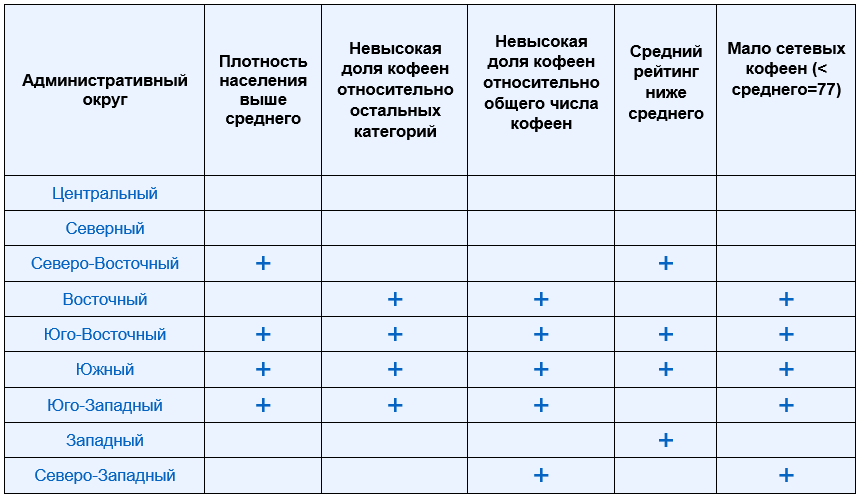


Ссылка на презентацию: https://disk.yandex.ru/i/aB7val8JmmoQqw 